# **환경 세팅 및 전처리**

In [ ]:
# 데이터조작 패키지
import numpy as np
import pandas as pd

# 시각화패키지
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
import plotly.express as px

# warning 메시지 무시
import warnings
warnings.filterwarnings('ignore')

# 전처리 패키지
import sklearn.preprocessing as pc      

# 날짜 시간 패키지
from datetime import datetime, timedelta

In [ ]:
# 한글 폰트 적용을 위한 코드
%config InlineBackend.figure_format = 'retina'
 
!apt -qq -y install fonts-nanum
 
import matplotlib.font_manager as fm
fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
font = fm.FontProperties(fname=fontpath, size=9)
plt.rc('font', family='NanumBarunGothic') 
fm._rebuild()

fonts-nanum is already the newest version (20170925-1).
0 upgraded, 0 newly installed, 0 to remove and 6 not upgraded.


In [ ]:
# 열과 행 생략없이 보기 위한 설정
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
# 드라이브에 업로드 된 파일 경로를 읽어오기 위한 코드
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
base_dir = '/content/gdrive/My Drive/Colab Notebooks/MES_csv/'

In [ ]:
# MES 테이블 데이터 로딩 - 불량 분석 관련 데이터만 로딩
daily_fault = pd.read_csv(base_dir+'daily_fault.csv')
material = pd.read_csv(base_dir+'material.csv')
moldlot = pd.read_csv(base_dir+'moldlot.csv')
prd_color = pd.read_csv(base_dir+'prd_color.csv')
prt = pd.read_csv(base_dir+'print.csv')
prt_std_value = pd.read_csv(base_dir+'prt_std_value.csv')
treat = pd.read_csv(base_dir+'treat.csv')

In [ ]:
# 불필요한 컬럼 드랍 + 필수데이터 결측된 행 드랍
material.drop(columns=['자재입고_cd_no', '자재입고_이름', '자재입고_수량', '자재입고_잔량', 'del_yn'], axis='columns', inplace=True)
material.dropna(axis='rows', inplace=True)
material.reset_index(inplace=True, drop=True)

moldlot.drop(columns=['샌드_잔량', '샌드_여부', 'ml_blk', 'blk_reason', 'blk_id', 'blk_dttm', 'del_yn'], axis='columns', inplace=True)
moldlot.dropna(subset=['투입로트', '입고로트', '샌드_건조기번호'], axis='rows', inplace=True)
moldlot.reset_index(inplace=True, drop=True)

prd_color.drop(columns=['컬러_바탕센터라인', '동판위치', '디자인_인쇄_순서'], axis='columns', inplace=True)
prd_color.dropna(subset=['상품코드', '컬러코드', '색상이름'], axis='rows', inplace=True)
prd_color.reset_index(inplace=True, drop=True)

prt.drop(columns=['인쇄_잔량', 'del_yn', '주문번호', '주문업체명', '인쇄_비고', '제품_타입', '렌즈타입', 'job_sch_no'], axis='columns', inplace=True)
prt.dropna(subset=['인쇄로트', '투입로트', '상품코드', '컬러코드'], axis='rows', inplace=True)
prt.reset_index(inplace=True, drop=True)

prt_std_value.drop(columns=['자재입고_cd_no', '비고'], axis='columns', inplace=True)
prt_std_value.drop(index=[288,461], axis='rows', inplace=True)
prt_std_value.dropna(subset=['상품코드', '컬러코드', '인쇄기계번호', '인쇄_작업날짜'], axis='rows', inplace=True)
prt_std_value.reset_index(inplace=True, drop=True)

treat.drop(columns=['멸균로트', '일반도수', '난시도수', '난시_축', '생산_수량차', 'thk_chk1', 'thk_chk2', 'thk_chk3', 'thk_chk4', 'thk_chk5', 'thk_chk6', 'thk_chk7', 'thk_chk8', 
                    'domestic', 'del_yn', '연마기계번호', '연마_불량', '연마_수량차', '연마_합격량', '연마_작업자', '연마_작업날짜', 'dgr_chk1', 'dgr_chk2', 'dgr_chk3', 'dgr_chk4', 
                    'dgr_chk5', 'dgr_chk6', 'dgr_chk7', 'dgr_chk8', 'dmt_chk1', 'dmt_chk2', 'dmt_chk3', 'dmt_chk4', 'dmt_chk5', 'dmt_chk6', 'dmt_chk7', 'dmt_chk8', 'cur_chk1', 
                    'cur_chk2', 'cur_chk3', 'cur_chk4', 'cur_chk4', 'cur_chk5', 'cur_chk6', 'cur_chk7', 'cur_chk8', '직경', '포장_수량차', '멸균_수량차', '품명', 'stg_rem_amt', 
                    'stg_wrk_id', 'stg_wrk_dt', 'lens_type', 'mold_type', 'p_job', 'emg_sample', 'div_abnormal', 'chk_lbl1', 'chk_lbl2', 'chk_lbl3', 'chk_lbl4', 'chk_lbl5', 
                    'chk_lbl6', 'chk_lbl7', 'chk_lbl8', 'chk_ext1', 'chk_ext2', 'chk_ext3', 'chk_ext4', 'chk_ext5', 'chk_ext6', 'chk_ext7', 'chk_ext8', 'chk_decision', 'remark', 
                    'div_rmk', 'trt2_rmk', 'ins_rmk', 'pkg_rmk', 'ste_rmk', 'chk_rmk', 'fc_mold_lot', '검사기계번호'], axis='columns', inplace=True)
treat.dropna(subset=['생산로트', '인쇄로트'], axis='rows', inplace=True)
treat.reset_index(inplace=True, drop=True)

In [ ]:
# 컬럼 형변환
daily_fault['일일불량_날짜'] = daily_fault['일일불량_날짜'].astype('datetime64[ns]')

material['입고로트'] = material['입고로트'].astype(str) 
material['자재입고_등록날짜'] = material['자재입고_등록날짜'].astype('datetime64[ns]') 

moldlot['입고로트'] = moldlot['입고로트'].astype(str) 
moldlot['샌드_작업날짜'] = moldlot['샌드_작업날짜'].astype('datetime64[ns]') 

prd_color['동판제조일'] = prd_color['동판제조일'].astype('datetime64[ns]') 

prt['인쇄_작업날짜'] = prt['인쇄_작업날짜'].astype('datetime64[ns]') 

temp = []
for item in prt_std_value['인쇄_작업날짜']:
  item = str(item)
  temp.append(item[:4]+'-'+item[4:6]+'-'+item[6:])
prt_std_value['인쇄_작업날짜'] = pd.Series(temp).astype('datetime64[ns]') 

treat['성형로트'] = treat['성형로트'].astype(str)
treat['생산_작업날짜'] = treat['생산_작업날짜'].astype('datetime64[ns]')
treat['생산_등록날짜'] = treat['생산_등록날짜'].astype('datetime64[ns]')
treat['탈거_작업날짜'] = treat['탈거_작업날짜'].astype('datetime64[ns]')
treat['수화_작업날짜'] = treat['수화_작업날짜'].astype('datetime64[ns]')
treat['검사_작업날짜'] = treat['검사_작업날짜'].astype('datetime64[ns]')
treat['포장_작업날짜'] = treat['포장_작업날짜'].astype('datetime64[ns]')
treat['멸균_작업날짜'] = treat['멸균_작업날짜'].astype('datetime64[ns]')
treat['최종검사_작업날짜'] = treat['최종검사_작업날짜'].astype('datetime64[ns]')

In [ ]:
# 각 테이블 함께 조회하기 위해 조인테이블 구성
mat_mold = pd.merge(material, moldlot, how='right', on=['입고로트'])

mat_mold_prt = pd.merge(mat_mold, prt, how='right', on=['투입로트'])

mat_mold_prt_trt = pd.merge(mat_mold_prt, treat, how='right', on=['인쇄로트'])

jointable = pd.merge(mat_mold_prt_trt, prt_std_value, how='left', on=['인쇄기계번호', '인쇄_작업날짜', '상품코드', '컬러코드'])

위 과정은 결측값 처리, 컬럼 형변환, 테이블 조인 등 전처리에 해당하는 과정<br><br>
***

<br><br>

# **각 불량 비율 및 발생횟수 합**

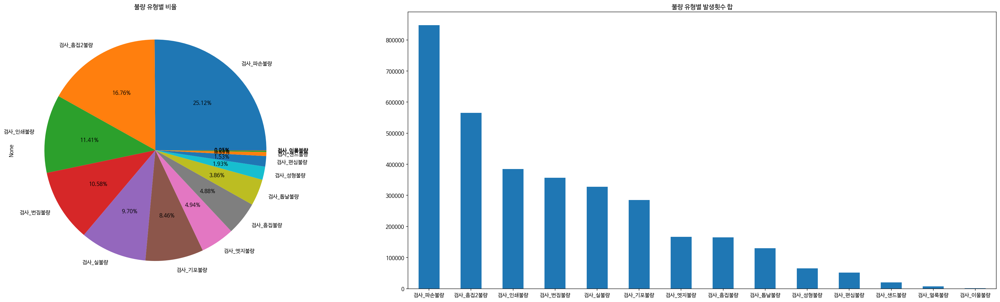

In [ ]:
# 불량 유형별 비율, 합 그래프
plt.figure(figsize=(30,8))

plt.subplot(1,2,1)
plt.title('불량 유형별 비율')
jointable[['검사_기포불량', '검사_이물불량', '검사_파손불량', '검사_엣지불량', '검사_흠집불량', '검사_흠집2불량', '검사_인쇄불량', 
           '검사_편심불량', '검사_실불량', '검사_톱날불량', '검사_샌드불량', '검사_성형불량', '검사_얼룩불량', '검사_번짐불량']].sum().sort_values(ascending=False).plot(kind='pie', autopct=('%0.2f%%'))

plt.subplot(1,2,2)
plt.title('불량 유형별 발생횟수 합')
jointable[['검사_기포불량', '검사_이물불량', '검사_파손불량', '검사_엣지불량', '검사_흠집불량', '검사_흠집2불량', '검사_인쇄불량', 
           '검사_편심불량', '검사_실불량', '검사_톱날불량', '검사_샌드불량', '검사_성형불량', '검사_얼룩불량', '검사_번짐불량']].sum().sort_values(ascending=False).plot(kind='bar')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

전체 불량 중 차지하는 비율이 높은 불량 순으로 불량 요인을 개선하는 것이 합리적일 것이다.<br>
따라서 전체의 약 75% 가량 차지하는 상위 5개 불량(파손, 흠집2, 인쇄, 번짐, 실)의 불량 요인을 개선하는 것이 최우선 과제이고, 그 외에는 기포, 엣지, 흠집, 톱날, 성형 불량 정도까지는 개선을 고려해볼 만한다고 여겨진다.<br>
 나머지 불량의 경우 차지하는 비율도 미비하고 거의 발생하지 않는 경우도 있으므로 배제해도 무방하다고 판단된다.<br><br>
 ***
 <br>

# **각 불량별 불량 발생 공정(추정치 입력된 것 -> 실제값X)**

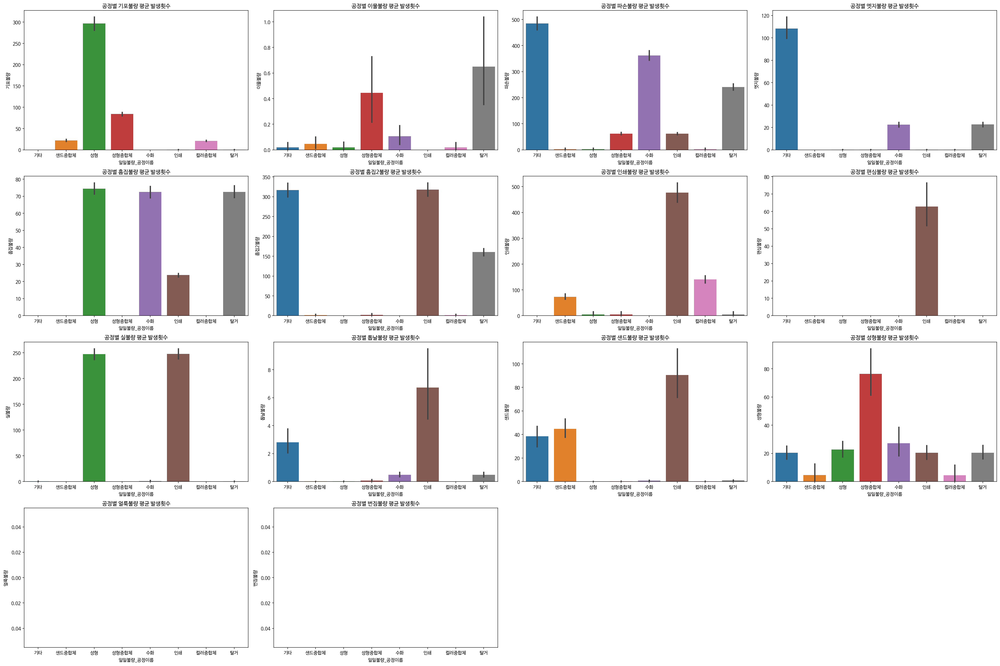

In [ ]:
# 각 공정 별 불량발생 평균 그래프
# 해당 데이터는 기록된 데이터가 아닌 추정치 수정필요!
plt.figure(figsize=(30,20))
for col,index in zip(['기포불량', '이물불량', '파손불량', '엣지불량', '흠집불량', '흠집2불량', '인쇄불량', '편심불량', '실불량', '톱날불량', '샌드불량', '성형불량', '얼룩불량', '번짐불량'],range(1,15)):
  plt.subplot(4,4,index)
  plt.title('공정별 '+col+' 평균 발생횟수')
  sns.barplot(x=daily_fault['일일불량_공정이름'],
              y=daily_fault[col])
  plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

***
<br><br>
# **각 불량별 월별 발생 합 그래프**

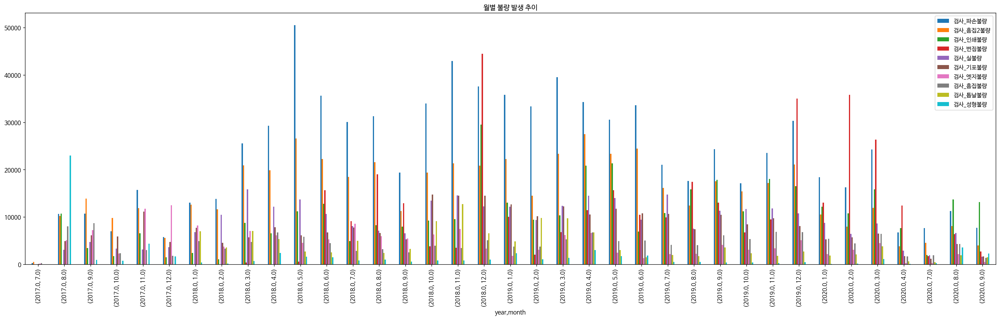

In [ ]:
jointable[['검사_파손불량', '검사_흠집2불량', '검사_인쇄불량', '검사_번짐불량', '검사_실불량', '검사_기포불량','검사_엣지불량', '검사_흠집불량','검사_톱날불량', '검사_성형불량', '검사_작업날짜']]\
.assign(year=lambda df: df['검사_작업날짜'].dt.year).assign(month=lambda df: df['검사_작업날짜'].dt.month).groupby(by=['year', 'month']).sum().plot(kind="bar", figsize=(30,8))
plt.title('월별 불량 발생 추이')
plt.xticks(rotation=90)

plt.show()

월별로 각 불량의 발생량 추이를 살펴봄으로 특정 기간에 많이 나타나는 불량이 있는지 확인해 본다.<br>
특정 기간(ex. 겨울)에 많이 나타나는 불량이라면 계절 등의 영향받을 수 있음을 예상해볼 수 있다.<br><br>

가장 많이 발생하는 파손불량에 경우, 기간에 따라 특정 패턴을 가진다고 보기에는 그래프가 들쭉날쭉하다. 그럼에도 다습한 여름에는 어느정도 줄어들고 비교적 건조한 겨울과 봄,가을에는 불량이 느는 것처럼 보인다. 이에 따라 건조한 계절에는 파손불량이 더 많이 발생할 가능성이 있다고 보여진다.<br><br>

흠집2 불량의 경우에도 파손불량과 어느정도 비슷한 흐름을 보이며, 마찬가지로 일정한 패턴을 가진다고 보기는 어려워보인다. 그럼에도 역시 건조해짐에 따라 불량이 많이 발생할 여지는 있다고 여겨진다.<br><br>

그 외에는 주기적으로 특별한 패턴을 보이는 경우가 없다.<br><br>
***
<br>

### **시간에 따른 5대 주요 불량 추이 그래프**

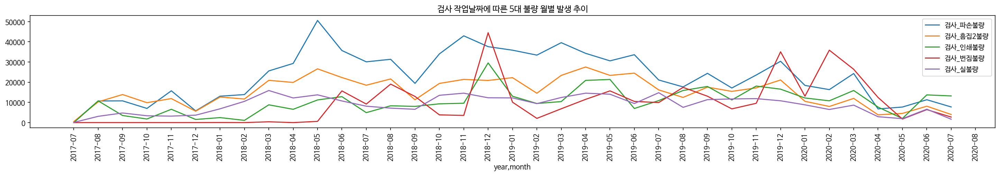

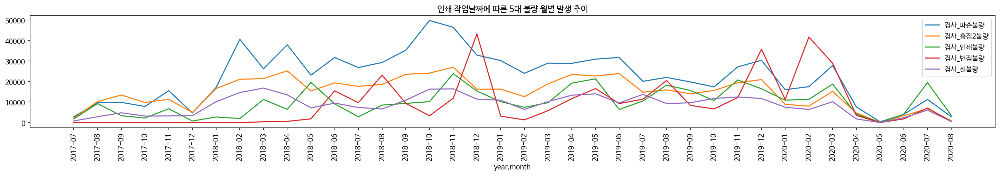

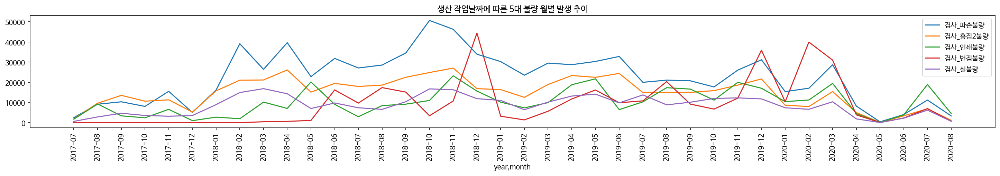

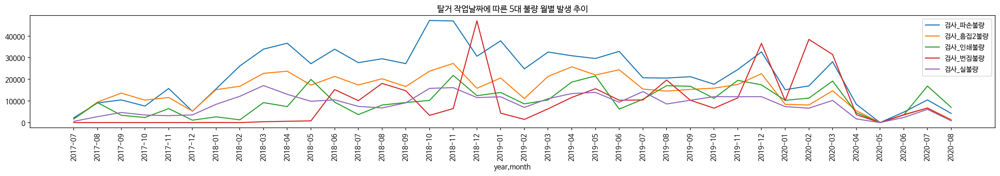

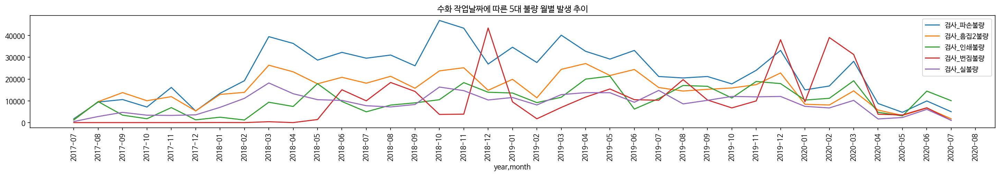

In [ ]:
# 5대불량 시간흐름에 따른 불량 발생 선그래프
temp = jointable.assign(year=lambda df: df['검사_작업날짜'].dt.year).assign(month=lambda df: df['검사_작업날짜'].dt.month)\
.groupby(by=['year', 'month'])['검사_파손불량', '검사_흠집2불량', '검사_인쇄불량', '검사_번짐불량', '검사_실불량'].sum().plot(kind='line', figsize=(25,3))
plt.title('검사 작업날짜에 따른 5대 불량 월별 발생 추이')
plt.xticks(ticks=list(range(0,38)), 
           labels=['2017-07','2017-08','2017-09','2017-10','2017-11','2017-12','2018-01','2018-02','2018-03','2018-04','2018-05','2018-06','2018-07','2018-08','2018-09','2018-10','2018-11','2018-12',
                   '2019-01','2019-02','2019-03','2019-04','2019-05','2019-06','2019-07','2019-08','2019-09','2019-10','2019-11','2019-12','2020-01','2020-02','2020-03','2020-04','2020-05','2020-06','2020-07','2020-08'],
           rotation=90)
plt.show()

temp = jointable.assign(year=lambda df: df['인쇄_작업날짜'].dt.year).assign(month=lambda df: df['인쇄_작업날짜'].dt.month)\
.groupby(by=['year', 'month'])['검사_파손불량', '검사_흠집2불량', '검사_인쇄불량', '검사_번짐불량', '검사_실불량'].sum().plot(kind='line', figsize=(25,3))
plt.title('인쇄 작업날짜에 따른 5대 불량 월별 발생 추이')
plt.xticks(ticks=list(range(0,38)), 
           labels=['2017-07','2017-08','2017-09','2017-10','2017-11','2017-12','2018-01','2018-02','2018-03','2018-04','2018-05','2018-06','2018-07','2018-08','2018-09','2018-10','2018-11','2018-12',
                   '2019-01','2019-02','2019-03','2019-04','2019-05','2019-06','2019-07','2019-08','2019-09','2019-10','2019-11','2019-12','2020-01','2020-02','2020-03','2020-04','2020-05','2020-06','2020-07','2020-08'],
           rotation=90)
plt.show()

temp = jointable.assign(year=lambda df: df['생산_작업날짜'].dt.year).assign(month=lambda df: df['생산_작업날짜'].dt.month)\
.groupby(by=['year', 'month'])['검사_파손불량', '검사_흠집2불량', '검사_인쇄불량', '검사_번짐불량', '검사_실불량'].sum().plot(kind='line', figsize=(25,3))
plt.title('생산 작업날짜에 따른 5대 불량 월별 발생 추이')
plt.xticks(ticks=list(range(0,38)), 
           labels=['2017-07','2017-08','2017-09','2017-10','2017-11','2017-12','2018-01','2018-02','2018-03','2018-04','2018-05','2018-06','2018-07','2018-08','2018-09','2018-10','2018-11','2018-12',
                   '2019-01','2019-02','2019-03','2019-04','2019-05','2019-06','2019-07','2019-08','2019-09','2019-10','2019-11','2019-12','2020-01','2020-02','2020-03','2020-04','2020-05','2020-06','2020-07','2020-08'],
           rotation=90)
plt.show()

temp = jointable.assign(year=lambda df: df['탈거_작업날짜'].dt.year).assign(month=lambda df: df['탈거_작업날짜'].dt.month)\
.groupby(by=['year', 'month'])['검사_파손불량', '검사_흠집2불량', '검사_인쇄불량', '검사_번짐불량', '검사_실불량'].sum().plot(kind='line', figsize=(25,3))
plt.title('탈거 작업날짜에 따른 5대 불량 월별 발생 추이')
plt.xticks(ticks=list(range(0,38)), 
           labels=['2017-07','2017-08','2017-09','2017-10','2017-11','2017-12','2018-01','2018-02','2018-03','2018-04','2018-05','2018-06','2018-07','2018-08','2018-09','2018-10','2018-11','2018-12',
                   '2019-01','2019-02','2019-03','2019-04','2019-05','2019-06','2019-07','2019-08','2019-09','2019-10','2019-11','2019-12','2020-01','2020-02','2020-03','2020-04','2020-05','2020-06','2020-07','2020-08'],
           rotation=90)
plt.show()

temp = jointable.assign(year=lambda df: df['수화_작업날짜'].dt.year).assign(month=lambda df: df['수화_작업날짜'].dt.month)\
.groupby(by=['year', 'month'])['검사_파손불량', '검사_흠집2불량', '검사_인쇄불량', '검사_번짐불량', '검사_실불량'].sum().plot(kind='line', figsize=(25,3))
plt.title('수화 작업날짜에 따른 5대 불량 월별 발생 추이')
plt.xticks(ticks=list(range(0,38)), 
           labels=['2017-07','2017-08','2017-09','2017-10','2017-11','2017-12','2018-01','2018-02','2018-03','2018-04','2018-05','2018-06','2018-07','2018-08','2018-09','2018-10','2018-11','2018-12',
                   '2019-01','2019-02','2019-03','2019-04','2019-05','2019-06','2019-07','2019-08','2019-09','2019-10','2019-11','2019-12','2020-01','2020-02','2020-03','2020-04','2020-05','2020-06','2020-07','2020-08'],
           rotation=90)
plt.show()

파손불량은 다습한 여름(7월~9월)에 어느정도 불량이 줄어드는 것으로 판단되고 탈거 및 수화 공정이 밀접하다 여겨진다.<br><br>
번짐불량은 모든 공정에서 유독 12월에 급상승하는 그래프를 보여주는데 어떤 의미인지 파악이 어렵다.<br><br>
주요 불량 중 위 두개를 제외하면 나머지 세가지 불량은 특정 기간에 일정한 패턴을 보여주는 일 없으므로 작업 날짜에 따른 불량 요인은 찾기 어려워 보인다.<br><br>
***
<br>

# **파손 불량 - 수화 공정**
수화 작업이 파손불량에 미치는 영향을 확인하기 위해 수화 공정의 주요한 변수인 작업자와 수화기계를 기준으로 파손불량과의 상관관계를 파악해보는 과정이다.

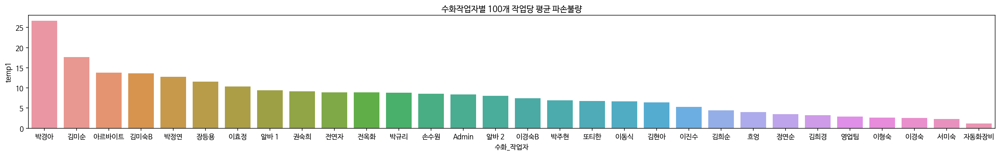

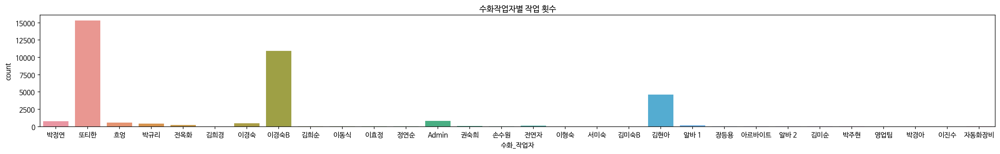

In [ ]:
# 수화작업자별 평균 파손불량 발생을 확인하여 불량 요인이 되는 특정 작업자 추적 가능 + 각 작업자별 총 작업 횟수 확인
plt.figure(figsize=(25,3))
plt.title('수화작업자별 100개 작업당 평균 파손불량')
temp = jointable.assign(temp1=lambda x:x['검사_파손불량']/x['탈거_합격량']*100).groupby(['수화_작업자'])['temp1'].mean().to_frame().sort_values(by='temp1', ascending=False)
sns.barplot(data=temp, x=temp.index, y='temp1')
plt.show()

plt.figure(figsize=(25,3))
plt.title('수화작업자별 작업 횟수')
sns.countplot(jointable['수화_작업자'])
plt.show()

불량 개수를 전체 작업량으로 나누고 100을 곱하여 100개 작업당 평균적으로 파손 불량이 얼마나 발생하는지 확인한 값이다.<br><br>
눈여겨 볼 점은 전체 작업이 특정 작업자 세명에게 몰려있고(오입력된 값이 아니라면) 해당 작업자들은 평균적으로 100개당 5개 이상씩 꾸준히 불량을 발생시키는 것과 자동화장비가 작업자들에 비해서 월등히 적은 불량을 기록한다는 점이다. <br>
작업자들에 경우 작업량이 많아질수록 불량이 더 많이 발생할 여지가 있음을 미루어 보면, 수화 공정을 자동화장비로 최대한 대체하는 것이 바람직해 보인다.(비용 문제는 고려하지 않은 의견)<br><br>

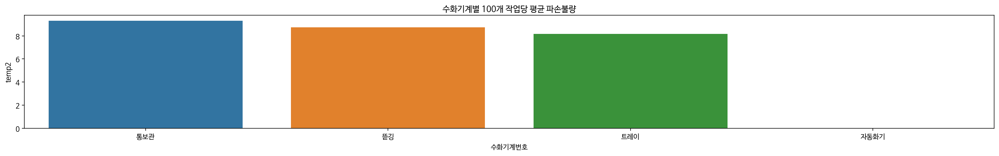

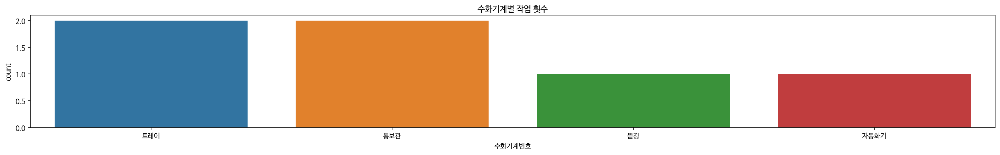

In [ ]:
# 수화기계별 평균 파손불량 발생을 확인하여 불량 요인이 되는 특정 작업자 추적 가능 + 각 기계별 총 작업 횟수 확인
plt.figure(figsize=(25,3))
plt.title('수화기계별 100개 작업당 평균 파손불량')
temp = jointable.assign(temp2=lambda x:x['검사_파손불량']/x['탈거_합격량']*100).groupby(['수화기계번호'])['temp2'].mean().to_frame().sort_values(by='temp2', ascending=False)
sns.barplot(data=temp, x=temp.index, y='temp2')
plt.show()

plt.figure(figsize=(25,3))
plt.title('수화기계별 작업 횟수')
sns.countplot(jointable['수화기계번호'])
plt.show()

수화기계별 count된 개수를 보면 트레이와 통보관이 2개, 뜯깅과 자동화기 데이터가 1개임을 확인할 수 있다. 따라서 해당 데이터는 대부분의 경우 결측되었음을 알 수 있으며 분석이 불가능하다고 판단한다.<br><br>

***
<br>

# **파손불량 - 탈거 공정**
탈거 공정이 파손불량에 어느정도 영향을 미치는지 확인하기 위해 탈거 공정의 주요한 변수인 작업자와 탈거기계를 기준으로 파손불량과의 상관 관계를 확인하는 과정이다.

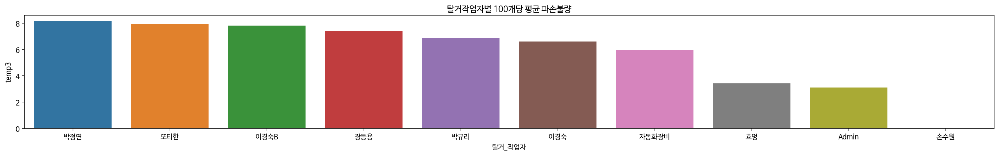

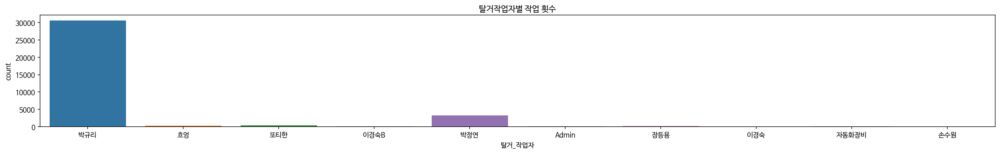

In [ ]:
# 탈거작업자별 평균 파손불량 발생을 확인하여 불량 요인이 되는 특정 작업자 추적 가능 + 작업자별 작업 횟수를 확인
plt.figure(figsize=(25,3))
plt.title('탈거작업자별 100개당 평균 파손불량')
temp = jointable.assign(temp3=lambda x:x['검사_파손불량']/x['생산_합격량']*100).groupby(['탈거_작업자'])['temp3'].mean().to_frame().sort_values(by='temp3', ascending=False)
sns.barplot(data=temp, x=temp.index, y='temp3')
plt.show()

plt.figure(figsize=(25,3))
plt.title('탈거작업자별 작업 횟수')
sns.countplot(jointable['탈거_작업자'])
plt.show()

탈거 작업자 데이터가 두 명의 작업자에게 극단적으로 몰려있음을 알 수 있다. 정확히 입력된 값이 맞는지 확인이 필요하다고 여겨진다.<br>제대로 입력된 값이 맞다는 전제 하에 각 작업자간 불량 발생 편차가 그리 큰 편이 아니고 가장 많은 데이터를 기록한 작업자와 자동화장비간의 격차가 의미 없는 수준이라 판단된다. 따라서 현 작업 방식의 개선책으로 자동화를 택할 필요는 없어 보인다.

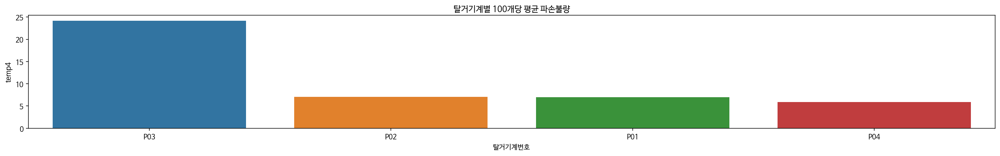

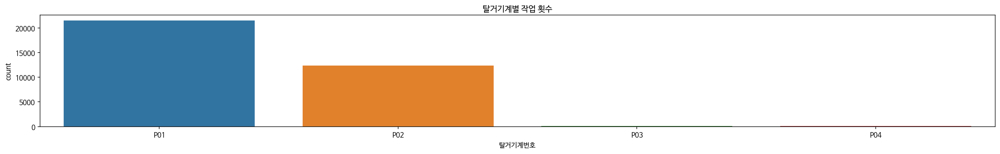

In [ ]:
# 탈거기계별 평균 파손불량 발생을 확인하여 불량 요인이 되는 기계 추적 + 기계별 작업 횟수 확인
plt.figure(figsize=(25,3))
plt.title('탈거기계별 100개당 평균 파손불량')
temp = jointable.assign(temp4=lambda x:x['검사_파손불량']/x['생산_합격량']*100).groupby(['탈거기계번호'])['temp4'].mean().to_frame().sort_values(by='temp4', ascending=False)
sns.barplot(data=temp, x=temp.index, y='temp4')
plt.show()

plt.figure(figsize=(25,3))
plt.title('탈거기계별 작업 횟수')
sns.countplot(jointable['탈거기계번호'])
plt.show()

평균적으로 발생하는 불량 개수를 보면 P02, P01, P04 기계간 차이는 거의 없다고 보여지고 유독 P03 기계에서 불량이 많이 발생함을 알 수 있다.<br>
하지만 기계 당 작업 횟수에서 P03 기계가 차지하는 건수는 거의 없음을 봤을 때, 해당 데이터에서는 현 작업 방식의 개선 방법을 찾기 어렵다고 여겨진다.<br><br>

***
<br>

# **파손불량 - 인쇄 공정**
인쇄 공정에서 파손불량을 발생시키는 요인이 있는지 알아보기 위해 인쇄 공정의 주요한 변수라 생각되는 인쇄기계, 인쇄 작업 날짜 및 그에 따른 인쇄기 설정값을 조회하고 파손불량과의 상관관계를 파악해보는 과정이다.

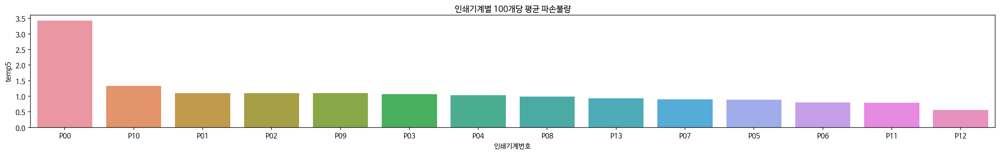

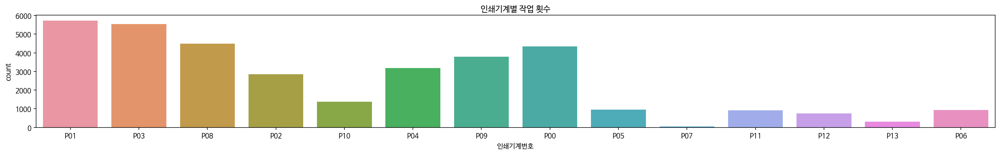

In [ ]:
# 인쇄기계별 평균 파손불량 발생 확인하여 불량 요인이 되는 기계 판별 + 인쇄기계별 작업 횟수 확인
plt.figure(figsize=(25,3))
plt.title('인쇄기계별 100개당 평균 파손불량')
temp = jointable.assign(temp5=lambda x:x['검사_파손불량']/x['인쇄_투입수량']*100).groupby(['인쇄기계번호'])['temp5'].mean().to_frame().sort_values(by='temp5', ascending=False)
sns.barplot(data=temp, x=temp.index, y='temp5')
plt.show()

plt.figure(figsize=(25,3))
plt.title('인쇄기계별 작업 횟수')
sns.countplot(jointable['인쇄기계번호'])
plt.show()

인쇄기계별 100개당 파손 불량 데이터를 보면 나머지 기계들은 큰 차이를 보이지 않는 반면, P00 기계에서 유독 불량 발생이 많음을 확인할 수 있다.<br>
작업 횟수를 확인해보아도 P00 기계가 차지하는 작업량이 의미있는 수준이므로 P00 기계에서 불량 발생을 억제할 방법의 모색이 필요해 보인다. 기계가 노후된 것이 이유일 수도 있고 해당 기계를 조작하는 방식이나 인쇄기 설정값의 문제일 수도 있으나 확인이 필요하다.<br>
이외에는 모두 100개당 1.5개를 밑도는 불량이 관측되므로 크게 개선할 점을 찾기 어려워 보인다.

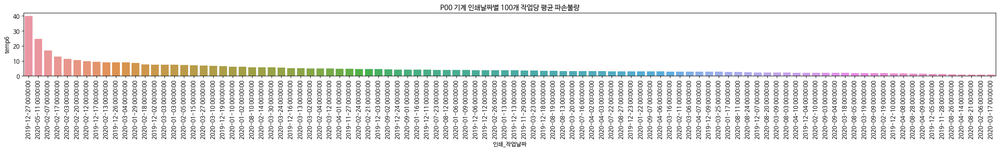

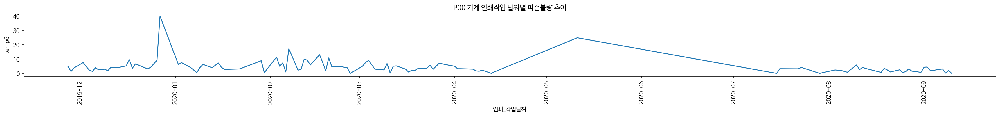

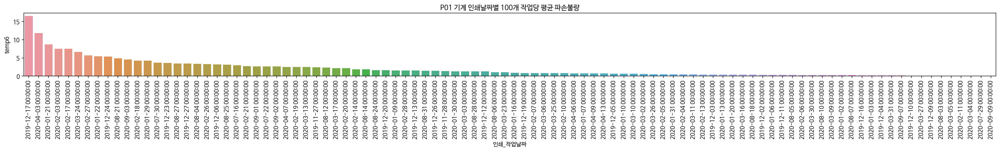

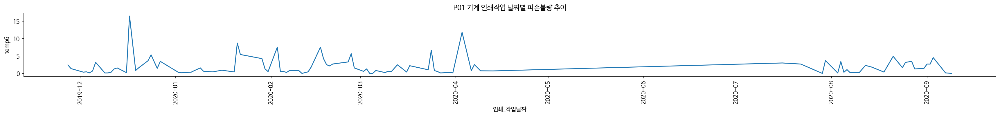

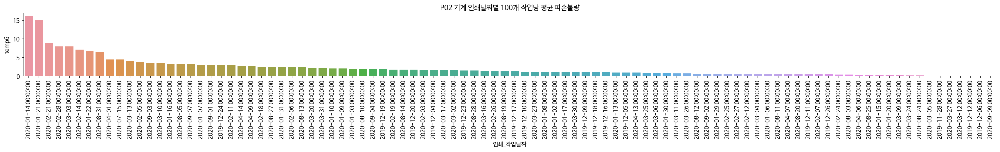

...

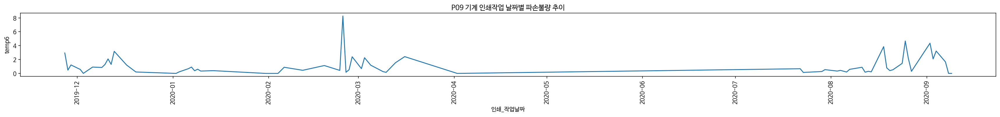

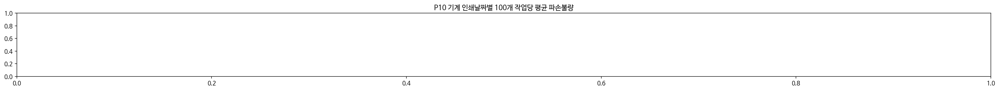

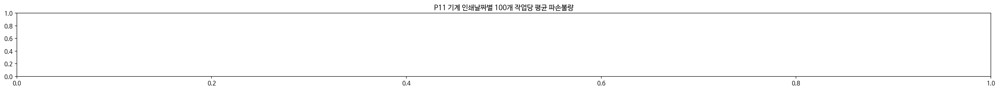

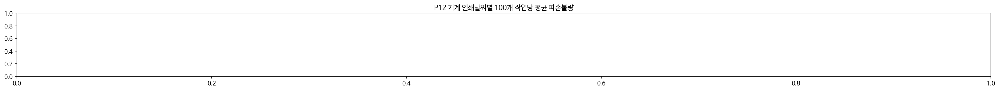

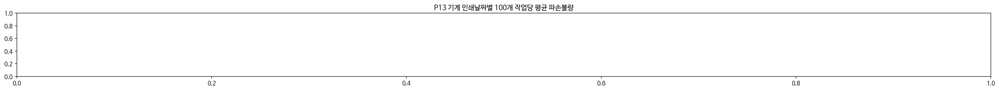

In [ ]:
# 인쇄 날짜별 평균 파손 불량을 확인하여 불량이 많이 발생한 날짜를 확인 및 인쇄기 설정 값 추적 가능
mch_list = sorted(list(jointable['인쇄기계번호'].unique()))

for mch_no in mch_list:
  try:
    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄날짜별 100개 작업당 평균 파손불량')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp6=lambda x:x['검사_파손불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp6'].mean().to_frame().sort_values(by='temp6', ascending=False).head(100)

    sns.barplot(data=temp, x=temp.index, y='temp6')
    plt.xticks(rotation=90)
    plt.show()

    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄작업 날짜별 파손불량 추이')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp6=lambda x:x['검사_파손불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp6'].mean().to_frame().sort_values(by='인쇄_작업날짜', ascending=True)
    sns.lineplot(data=temp, x=temp.index, y='temp6')
    plt.xticks(rotation=90)
    plt.show()
  except:
    pass

2017년도부터 데이터가 있음에도 2019년도 데이터부터 살펴보는 것은 인쇄기 설정값 데이터가 2019년 11월 27일경부터 존재하기 때문이다.<br>

하단의 표에서 각 인쇄기별로 불량이 많은 상위 20개 데이터의 인쇄기 설정값을 확인할 수 있다.

In [ ]:
# 파손불량 내림차 정렬로 각 인쇄기 설정값 확인
value_check_df = pd.DataFrame()

for mch_no in mch_list:
    temp = jointable
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"')\
    [['검사_파손불량','상품코드','컬러코드','인쇄기계번호','인쇄_작업날짜','인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력',
      '패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']].sort_values(by='검사_파손불량', ascending=False)\
      .dropna(how='all', axis='rows', subset=['인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력','패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']).head(20)
    value_check_df = value_check_df.append(temp)

value_check_df

,검사_파손불량,상품코드,컬러코드,인쇄기계번호,인쇄_작업날짜,인쇄_대기,건조_대기,샌드_종류,인쇄_압력,동판_압력,패드_경도,패드1,패드2,패드3,패드4,에어노즐1,에어노즐2,에어노즐3,에어노즐4
35093,237,A3018,PURE HAZEL,P01,2020-09-01,2.7,2.7,K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,2.0,NaN
31668,122,K2055,GRAY,P01,2020-02-14,0.6,NaN,A,3.70,3.90,29.0,38,38,NaN,NaN,NaN,0.0,0.0,NaN
29075,107,K3001,BLUE,P01,2019-12-06,NaN,NaN,A,3.60,3.70,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29074,107,K3001,BLUE,P01,2019-12-06,NaN,NaN,A,3.60,3.70,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34504,97,K1003,BLACK,P01,2020-08-07,2.8,2.8,K,3.80,3.40,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30638,96,A3058,HONEY,P01,2020-01-09,NaN,NaN,A,3.50,3.70,29.0,B,B,B,NaN,1.0,3.0,0.0,NaN
28298,93,K3001,GRAY,P01,2019-11-28,NaN,NaN,A,3.60,3.40,29.0,B,B,B,NaN,0.0,2.0,2.0,NaN
28297,90,K3001,GRAY,P01,2019-11-28,NaN,NaN,A,3.60,3.40,29.0,B,B,B,NaN,0.0,2.0,2.0,NaN
29670,85,A1013,BROWN,P01,2019-12-20,NaN,NaN,A,3.50,3.70,29.0,NaN,NaN,B,NaN,NaN,NaN,3.0,NaN
31137,84,JS63,GRAY,P01,2020-01-30,NaN,NaN,NaN,3.80,3.50,NaN,B,B,B,NaN,0.0,3.0,3.0,NaN


# **흠집2불량 - 인쇄 공정**
인쇄 공정에서 흠집2불량 발생을 유발하는 요인이 있는지 확인하기 위해 인쇄 작업날짜와 인쇄기계번호를 통해 인쇄기 설정값을 조회하고 개선 방안을 모색하는 과정이다.

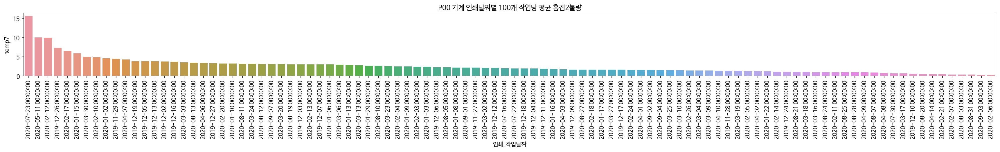

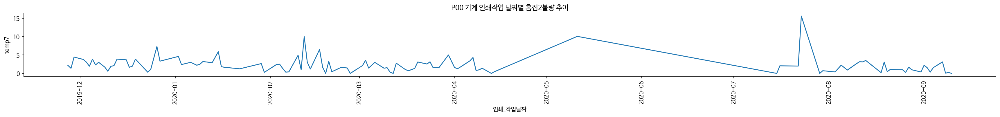

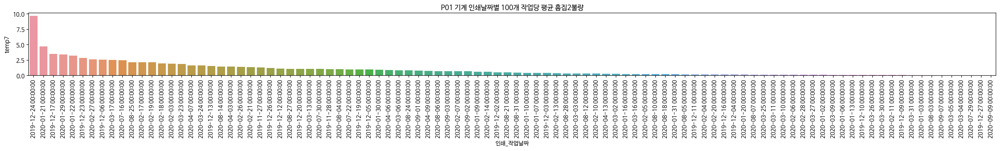

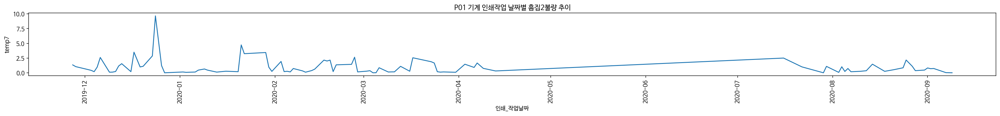

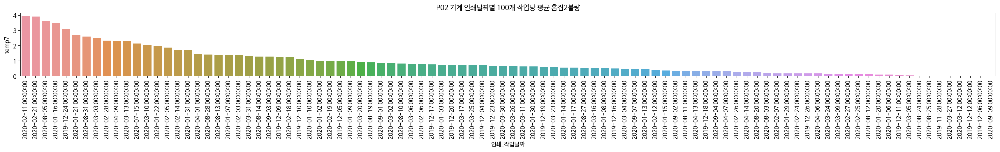

...

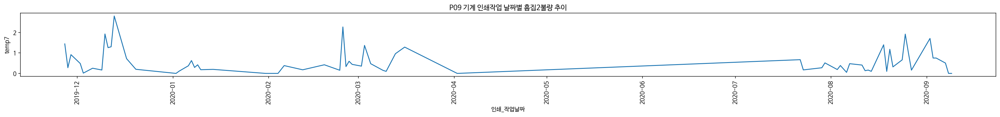

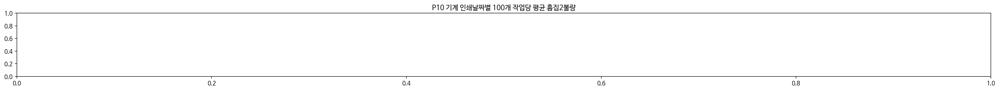

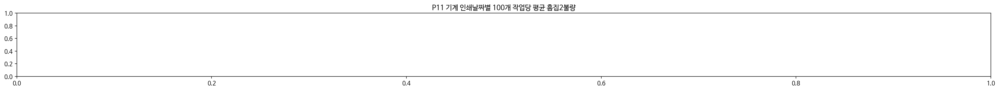

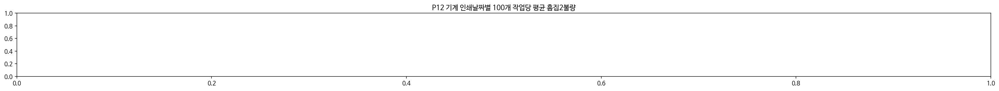

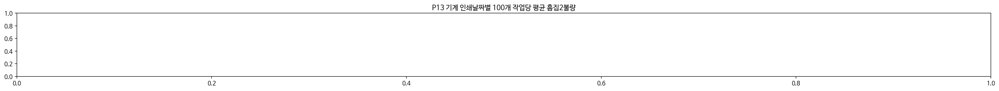

In [ ]:
# 인쇄 날짜별로 불량발생을 확인하여 많이 발생한 날짜를 추려냄, 추려낸 날짜로 인쇄기 설정 값을 조회해 볼 수 있을 것으로 예상

mch_list = sorted(list(jointable['인쇄기계번호'].unique()))

for mch_no in mch_list:
  try:
    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄날짜별 100개 작업당 평균 흠집2불량')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp7=lambda x:x['검사_흠집2불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp7'].mean().to_frame().sort_values(by='temp7', ascending=False).head(100)
    sns.barplot(data=temp, x=temp.index, y='temp7')
    plt.xticks(rotation=90)
    plt.show()

    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄작업 날짜별 흠집2불량 추이')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp7=lambda x:x['검사_흠집2불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp7'].mean().to_frame().sort_values(by='인쇄_작업날짜', ascending=True)
    sns.lineplot(data=temp, x=temp.index, y='temp7')
    plt.xticks(rotation=90)
    plt.show()
  except:
    pass

날짜별 데이터로는 크게 불량 요인을 추적키 어렵고 인쇄기 설정 값에 경우에도 어떤 설정값이 불량을 유발하는지를 도메인 지식의 부족으로 알기 어려우므로 일단 값의 확인을 위해 하단에 표를 참고하시길 바란다.

In [ ]:
# 흠집2불량 내림차정렬로 인쇄기 설정 값 조회
value_check_df = pd.DataFrame()

for mch_no in mch_list:
    temp = jointable
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"')\
    [['검사_흠집2불량','상품코드','컬러코드','인쇄기계번호','인쇄_작업날짜','인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력',
      '패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']].sort_values(by='검사_흠집2불량', ascending=False)\
      .dropna(how='all', axis='rows', subset=['인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력','패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']).head(20)
    value_check_df = value_check_df.append(temp)

value_check_df

,검사_흠집2불량,상품코드,컬러코드,인쇄기계번호,인쇄_작업날짜,인쇄_대기,건조_대기,샌드_종류,인쇄_압력,동판_압력,패드_경도,패드1,패드2,패드3,패드4,에어노즐1,에어노즐2,에어노즐3,에어노즐4
29670,111,A1013,BROWN,P01,2019-12-20,NaN,NaN,A,3.50,3.70,29.0,NaN,NaN,B,NaN,NaN,NaN,3.0,NaN
33110,92,B2004,BABY BROWN,P01,2020-03-17,1.0,NaN,K,3.70,3.50,29.0,NaN,22,53,NaN,0.0,0.0,0.0,NaN
29074,81,K3001,BLUE,P01,2019-12-06,NaN,NaN,A,3.60,3.70,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28298,80,K3001,GRAY,P01,2019-11-28,NaN,NaN,A,3.60,3.40,29.0,B,B,B,NaN,0.0,2.0,2.0,NaN
29075,76,K3001,BLUE,P01,2019-12-06,NaN,NaN,A,3.60,3.70,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31139,69,JS63,GRAY,P01,2020-01-30,NaN,NaN,NaN,3.80,3.50,NaN,B,B,B,NaN,0.0,3.0,3.0,NaN
34504,69,K1003,BLACK,P01,2020-08-07,2.8,2.8,K,3.80,3.40,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29807,68,A1013,BROWN,P01,2019-12-23,NaN,NaN,A,3.10,3.40,29.0,NaN,NaN,B,NaN,NaN,NaN,2.0,NaN
31731,68,K2055,BROWN,P01,2020-02-19,2.0,2.0,A,3.50,3.50,29.0,NaN,10,50,NaN,0.0,3.0,1.0,NaN
35093,68,A3018,PURE HAZEL,P01,2020-09-01,2.7,2.7,K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,2.0,NaN


# **흠집2불량 - 탈거 공정**
탈거 공정의 주요 요인이라 여겨지는 탈거기계와 작업자 변수가 흠집2불량과 어떤 상관관계를 가지는지 확인하기 위한 과정이다.

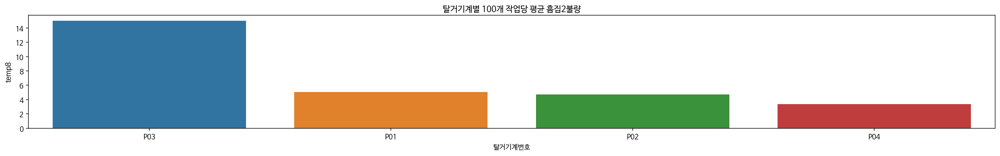

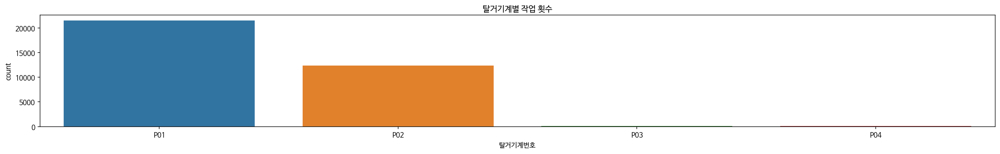

In [ ]:
# 탈거기계별, 작업자별 불량 발생을 살펴봄으로 특정 기계, 작업자가 불량 요인이 되는지 파악
plt.figure(figsize=(25,3))
plt.title('탈거기계별 100개 작업당 평균 흠집2불량')
temp = jointable.assign(temp8=lambda x:x['검사_흠집2불량']/x['생산_합격량']*100).groupby(['탈거기계번호'])['temp8'].mean().to_frame().sort_values(by='temp8', ascending=False)
sns.barplot(data=temp, x=temp.index, y='temp8')
plt.show()

plt.figure(figsize=(25,3))
plt.title('탈거기계별 작업 횟수')
sns.countplot(jointable['탈거기계번호'])
plt.show()

P03 기계가 가장 많은 흠집2불량을 유발하고 나머지 기계는 적은 수치를 기록하고 있다. <br>하지만 P03 기계의 경우 작업 횟수가 거의 없다시피 하므로 본 데이터에서는 흠집2불량 발생을 개선할 여지가 거의 없다고 보여진다.

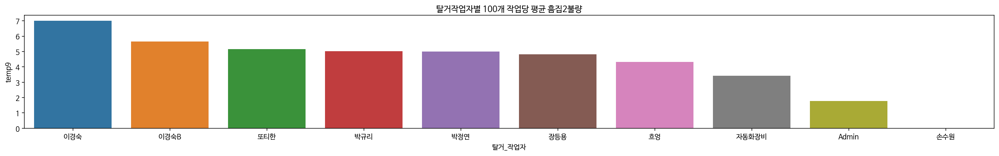

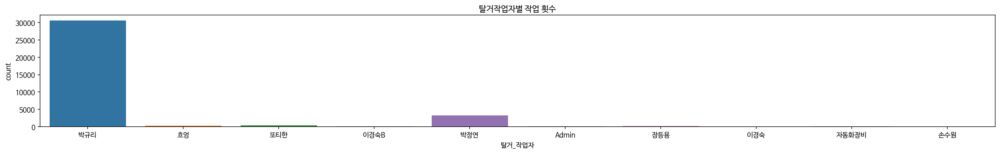

In [ ]:
plt.figure(figsize=(25,3))
plt.title('탈거작업자별 100개 작업당 평균 흠집2불량')
temp = jointable.assign(temp9=lambda x:x['검사_흠집2불량']/x['생산_합격량']*100).groupby(['탈거_작업자'])['temp9'].mean().to_frame().sort_values(by='temp9', ascending=False)
sns.barplot(data=temp, x=temp.index, y='temp9')
plt.show()

plt.figure(figsize=(25,3))
plt.title('탈거작업자별 작업 횟수')
sns.countplot(jointable['탈거_작업자'])
plt.show()

각 작업자별로 불량 발생의 차이가 그리 크지 않고 특정 작업자 둘에게 대다수의 작업 횟수가 몰려있는 것이 특징이다. 자동화장비의 도입으로 일정수준 개선이 가능하다 보여지지만 큰 효과를 얻기에는 어려움이 있어보인다.<br><br>
***
<br>

# **인쇄불량 - 인쇄 공정**
인쇄 공정에서 인쇄불량을 유발할 수 있다고 여겨지는 인쇄기계, 인쇄 작업날짜와 그를 통해 해당 날짜의 특정 인쇄기 설정값을 확인하여 개선점을 모색하는 과정이다.

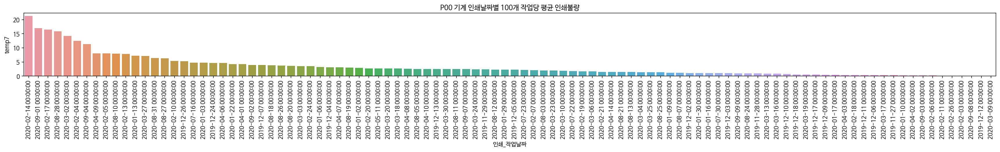

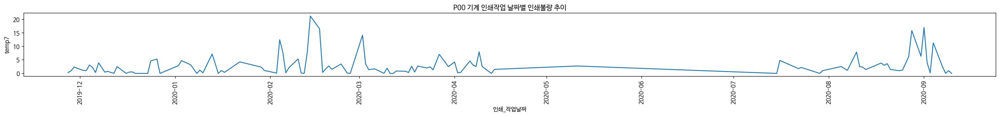

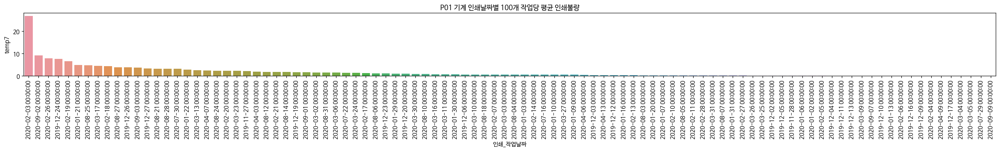

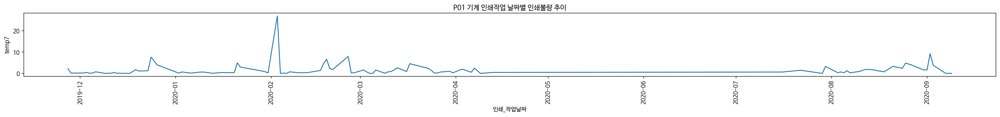

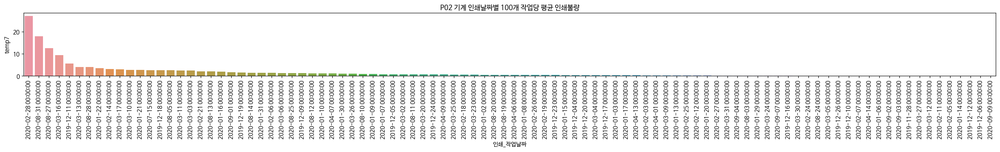

...

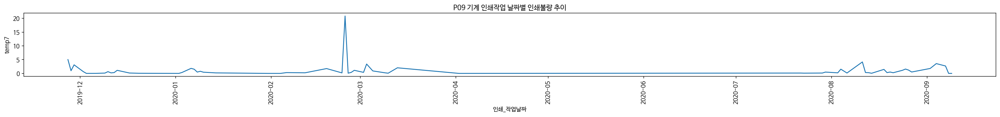

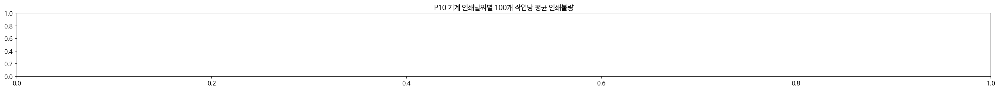

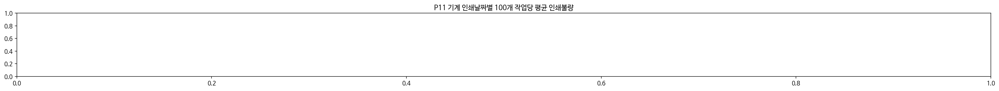

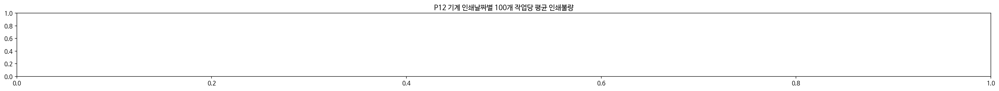

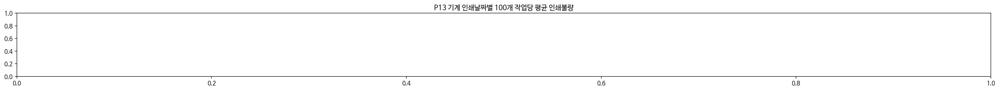

In [ ]:
# 인쇄불량이 많이 발생한 날짜는 추려내고 추려낸 날짜로 인쇄기 설정 값 추적 가능

mch_list = sorted(list(jointable['인쇄기계번호'].unique()))

for mch_no in mch_list:
  try:
    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄날짜별 100개 작업당 평균 인쇄불량')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp7=lambda x:x['검사_인쇄불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp7'].mean().to_frame().sort_values(by='temp7', ascending=False).head(100)
    sns.barplot(data=temp, x=temp.index, y='temp7')
    plt.xticks(rotation=90)
    plt.show()

    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄작업 날짜별 인쇄불량 추이')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp7=lambda x:x['검사_인쇄불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp7'].mean().to_frame().sort_values(by='인쇄_작업날짜', ascending=True)
    sns.lineplot(data=temp, x=temp.index, y='temp7')
    plt.xticks(rotation=90)
    plt.show()
  except:
    pass

P00 기계의 경우 꽤 많은 불량을 기록하지만 하단의 표에서는 해당 데이터를 확인할 수가 없다. 이는 해당 기계의 관련 인자들이 모두 결측되어 확인할 설정값이 전무하기 때문인데 입력 누락인지 해당 기계의 특성인지 여부 확인이 필요하다.<br>

In [ ]:
# 인쇄불량 내림차 정렬로 프린터 설정값 확인
value_check_df = pd.DataFrame()

for mch_no in mch_list:
    temp = jointable
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"')\
    [['검사_인쇄불량','상품코드','컬러코드','인쇄기계번호','인쇄_작업날짜','인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력',
      '패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']].sort_values(by='검사_인쇄불량', ascending=False)\
      .dropna(how='all', axis='rows', subset=['인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력','패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']).head(20)
    value_check_df = value_check_df.append(temp)

value_check_df

,검사_인쇄불량,상품코드,컬러코드,인쇄기계번호,인쇄_작업날짜,인쇄_대기,건조_대기,샌드_종류,인쇄_압력,동판_압력,패드_경도,패드1,패드2,패드3,패드4,에어노즐1,에어노즐2,에어노즐3,에어노즐4
33109,207,B2004,BABY BROWN,P01,2020-03-17,1.0,NaN,K,3.70,3.50,29.0,NaN,22,53,NaN,0.0,0.0,0.0,NaN
31730,184,K2055,BROWN,P01,2020-02-19,2.0,2.0,A,3.50,3.50,29.0,NaN,10,50,NaN,0.0,3.0,1.0,NaN
30338,153,K3012,VIOLET,P01,2020-01-03,NaN,NaN,A,3.50,3.70,29.0,B,B,B,NaN,1.0,1.0,1.0,NaN
32112,142,K2043,BROWN,P01,2020-02-26,0.6,0.6,A,3.50,3.60,29.0,NaN,10,50,NaN,NaN,2.0,2.0,NaN
29670,135,A1013,BROWN,P01,2019-12-20,NaN,NaN,A,3.50,3.70,29.0,NaN,NaN,B,NaN,NaN,NaN,3.0,NaN
34504,109,K1003,BLACK,P01,2020-08-07,2.8,2.8,K,3.80,3.40,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32113,96,K2043,BROWN,P01,2020-02-26,0.6,0.6,A,3.50,3.60,29.0,NaN,10,50,NaN,NaN,2.0,2.0,NaN
32345,88,K2055,GREEN,P01,2020-03-02,0.6,0.6,K,3.70,3.40,29.0,NaN,52,50,NaN,0.0,2.0,0.0,NaN
31731,81,K2055,BROWN,P01,2020-02-19,2.0,2.0,A,3.50,3.50,29.0,NaN,10,50,NaN,0.0,3.0,1.0,NaN
35048,80,F155,MAUL,P01,2020-08-31,2.7,2.7,K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,2.0,NaN


# **인쇄불량 - 샌드 공정**
샌드 공정과 인쇄불량과의 상관관계를 확인하기 위해 주요 인자라 여겨지는 샌드중합체의 고유번호와 불량을 매치하여 확인하는 과정이다.

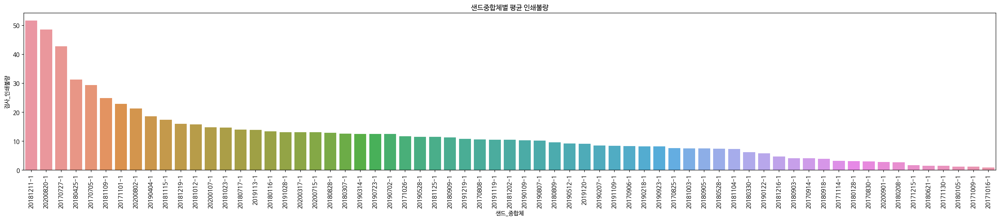

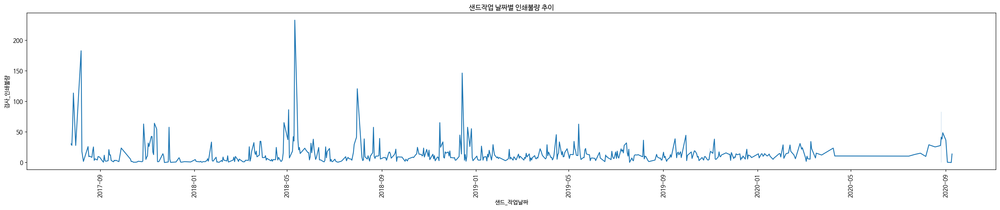

In [ ]:
# 샌드중합체별 인쇄 불량 발생을 살펴봄으로 특정 샌드중합체가 인쇄 불량 요인으로 작용하는지 확인
# 컬러중합체는 데이터가 없어서 추적 불가.
plt.figure(figsize=(30,5))
plt.title('샌드중합체별 평균 인쇄불량')
temp = jointable.groupby(['샌드_중합체'])['검사_인쇄불량'].mean().to_frame().sort_values(by='검사_인쇄불량', ascending=False).head(100)
sns.barplot(data=temp, x=temp.index, y='검사_인쇄불량')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(30,5))
plt.title('샌드작업 날짜별 인쇄불량 추이')
temp = jointable.groupby(['샌드_중합체','샌드_작업날짜'])['검사_인쇄불량'].mean().to_frame().sort_values(by='샌드_작업날짜', ascending=False)
sns.lineplot(data=temp, x='샌드_작업날짜', y='검사_인쇄불량')
plt.xticks(rotation=90)
plt.show()

막대그래프를 통해 가장 불량이 많이 발생했던 중합체를 확인할 수 있는데 관련해서 자세한 데이터가 없으므로 해당 중합체에서 불량이 많이 발생한 것만 확인할 수 있고 별도의 인사이트를 도출하기에는 어려움이 있다.<br>
시간 흐름에 따른 불량 발생 추이도 확인하는 그래프에서는 특정 구간에서 불량이 많이 발생했지만 일정한 패턴이 보이지는 않으므로 시기적 특성에 따른 불량 발생이라기보다는 해당 기간 작업에서 다른 요인에 의해 불량이 많이 관측된거라 판단된다.<br><br>

***
<br>

# **실불량 - 인쇄 공정**
실불량과 인쇄 공정 간의 상관관계를 확인하는 과정이다.

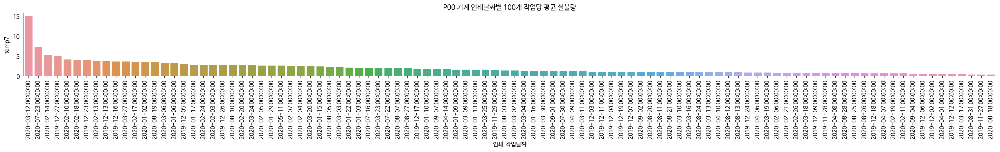

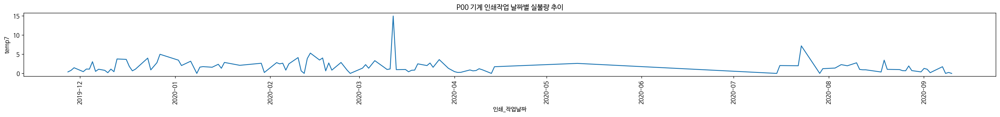

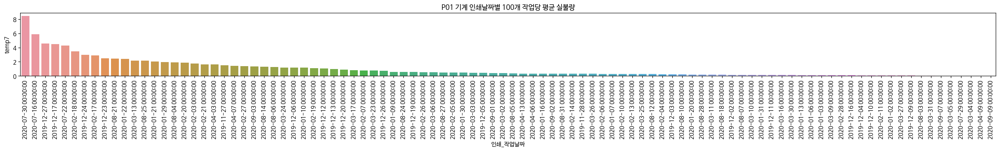

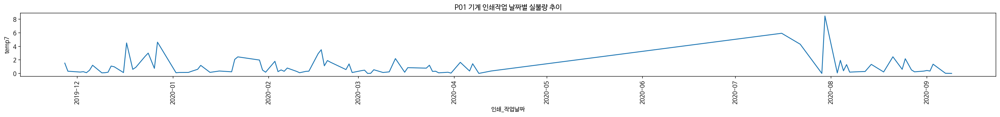

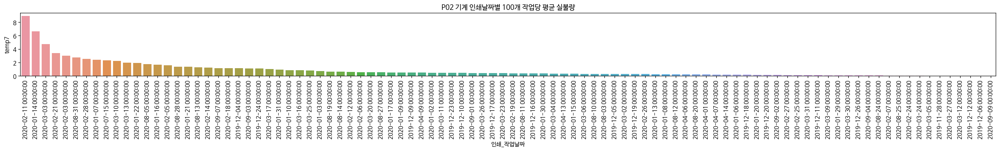

...

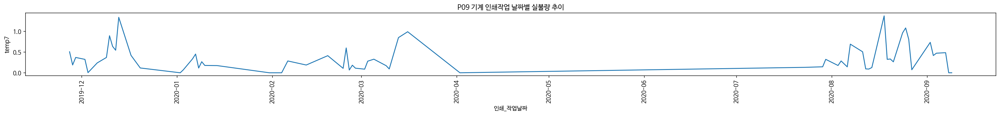

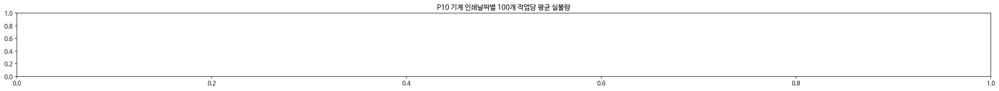

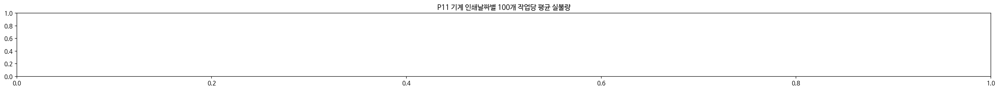

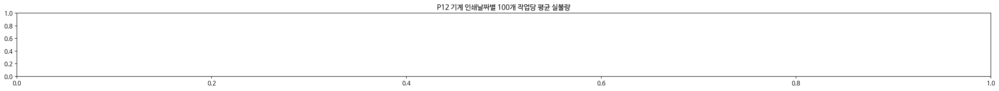

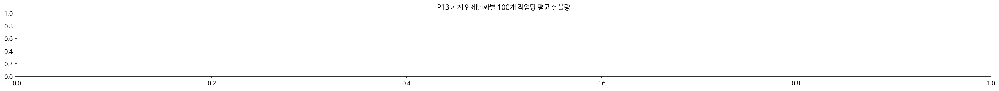

In [ ]:
# 인쇄날짜별 실불량 발생 데이터 확인을 통해 실불량이 많이 발생한 특정 날짜의 인쇄기 설정 값 추적 가능
# 인쇄 작업날짜를 2019년 11월 27일 이후로 제한한 것은 인쇄기 설정 값 추적이 해당 일자 이후부터 가능하기 때문.

mch_list = sorted(list(jointable['인쇄기계번호'].unique()))

for mch_no in mch_list:
  try:
    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄날짜별 100개 작업당 평균 실불량')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp7=lambda x:x['검사_실불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp7'].mean().to_frame().sort_values(by='temp7', ascending=False).head(100)
    sns.barplot(data=temp, x=temp.index, y='temp7')
    plt.xticks(rotation=90)
    plt.show()

    plt.figure(figsize=(30,2))
    plt.title(mch_no+' 기계 인쇄작업 날짜별 실불량 추이')
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"').assign(temp7=lambda x:x['검사_실불량']/x['인쇄_투입수량']*100)\
    .groupby(['인쇄_작업날짜'])['temp7'].mean().to_frame().sort_values(by='인쇄_작업날짜', ascending=True)
    sns.lineplot(data=temp, x=temp.index, y='temp7')
    plt.xticks(rotation=90)
    plt.show()
  except:
    pass

In [ ]:
# 실불량 내림차 정렬로 프린터 설정값 확인
value_check_df = pd.DataFrame()

for mch_no in mch_list:
    temp = jointable
    temp = jointable.query('인쇄기계번호=="'+mch_no+'"').query('인쇄_작업날짜>="2019-11-27"')\
    [['검사_실불량','상품코드','컬러코드','인쇄기계번호','인쇄_작업날짜','인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력',
      '패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']].sort_values(by='검사_실불량', ascending=False)\
      .dropna(how='all', axis='rows', subset=['인쇄_대기','건조_대기','샌드_종류','인쇄_압력','동판_압력','패드_경도','패드1','패드2','패드3','패드4','에어노즐1','에어노즐2','에어노즐3','에어노즐4']).head(20)
    value_check_df = value_check_df.append(temp)

value_check_df

,검사_실불량,상품코드,컬러코드,인쇄기계번호,인쇄_작업날짜,인쇄_대기,건조_대기,샌드_종류,인쇄_압력,동판_압력,패드_경도,패드1,패드2,패드3,패드4,에어노즐1,에어노즐2,에어노즐3,에어노즐4
31328,102,A2059,BROWN,P01,2020-02-05,NaN,NaN,A,3.7,4.10,29.0,NaN,B,B,NaN,NaN,NaN,2.0,NaN
34122,76,A1015,BROWN,P01,2020-07-22,1.3,1.3,K,3.6,3.50,29.0,NaN,NaN,NaN,41,NaN,NaN,NaN,6.0
29808,75,A1013,BROWN,P01,2019-12-23,NaN,NaN,A,3.1,3.40,29.0,NaN,NaN,B,NaN,NaN,NaN,2.0,NaN
34123,62,A1015,BROWN,P01,2020-07-22,1.3,1.3,K,3.6,3.50,29.0,NaN,NaN,NaN,41,NaN,NaN,NaN,6.0
29481,62,A3058,HONEY,P01,2019-12-13,NaN,NaN,A,3.5,3.70,29.0,B,B,B,NaN,0.0,2.0,1.0,NaN
29807,62,A1013,BROWN,P01,2019-12-23,NaN,NaN,A,3.1,3.40,29.0,NaN,NaN,B,NaN,NaN,NaN,2.0,NaN
29670,62,A1013,BROWN,P01,2019-12-20,NaN,NaN,A,3.5,3.70,29.0,NaN,NaN,B,NaN,NaN,NaN,3.0,NaN
30703,62,A3058,HAZEL,P01,2020-01-10,NaN,NaN,NaN,3.5,3.70,NaN,B,B,B,NaN,1.0,3.0,0.0,NaN
31330,53,A2059,BROWN,P01,2020-02-05,NaN,NaN,A,3.7,4.10,29.0,NaN,B,B,NaN,NaN,NaN,2.0,NaN
29672,49,A1013,BROWN,P01,2019-12-20,NaN,NaN,A,3.5,3.70,29.0,NaN,NaN,B,NaN,NaN,NaN,3.0,NaN


# **실불량 - 성형 공정(trt)**
실불량과 성형 공정 간의 상관관계를 확인하기 위해 성형로트번호를 기준으로 불량 발생을 추적하는 과정이다.

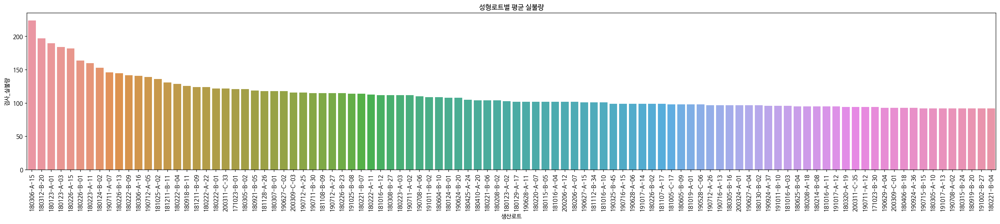

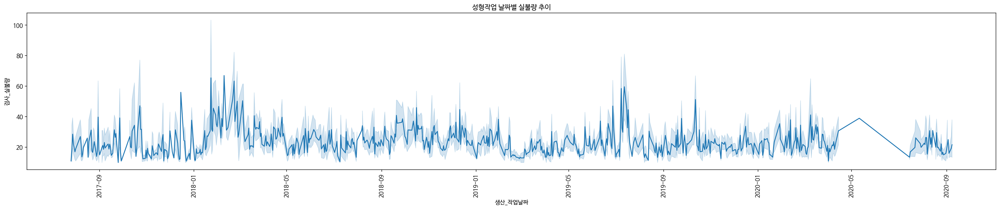

In [ ]:
# 성형로트별 실불량 발생 확인, 특정 로트가 불량 발생 요인인지 검증
# 성형 단계의 다른 요인들과 매칭이 필요함(ex.성형온도, 성형시간, 교반로트, 가동시간 등)
# 데이터가 너무 많아 상위 100개의 데이터만 확인
plt.figure(figsize=(30,5))
plt.title('성형로트별 평균 실불량')
trt_lot = jointable.query('검사_실불량>'+str(jointable['검사_실불량'].mean())).groupby(['생산로트'])['검사_실불량'].mean().to_frame().sort_values(by='검사_실불량', ascending=False).head(100)
sns.barplot(data=trt_lot, x=trt_lot.index, y='검사_실불량')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(30,5))
plt.title('성형작업 날짜별 실불량 추이')
temp = jointable.query('검사_실불량>'+str(jointable['검사_실불량'].mean())).groupby(['생산로트','생산_작업날짜'])['검사_실불량'].mean().to_frame().sort_values('생산_작업날짜')
sns.lineplot(data=temp, x='생산_작업날짜', y='검사_실불량')
plt.xticks(rotation=90)
plt.show()

시간에 흐름에 따른 그래프에서는 특별하게 발견할 만한 패턴이 검출되지 않으므로 특정 기간에 따라 불량 발생이 느는 현상은 없다고 여겨진다.

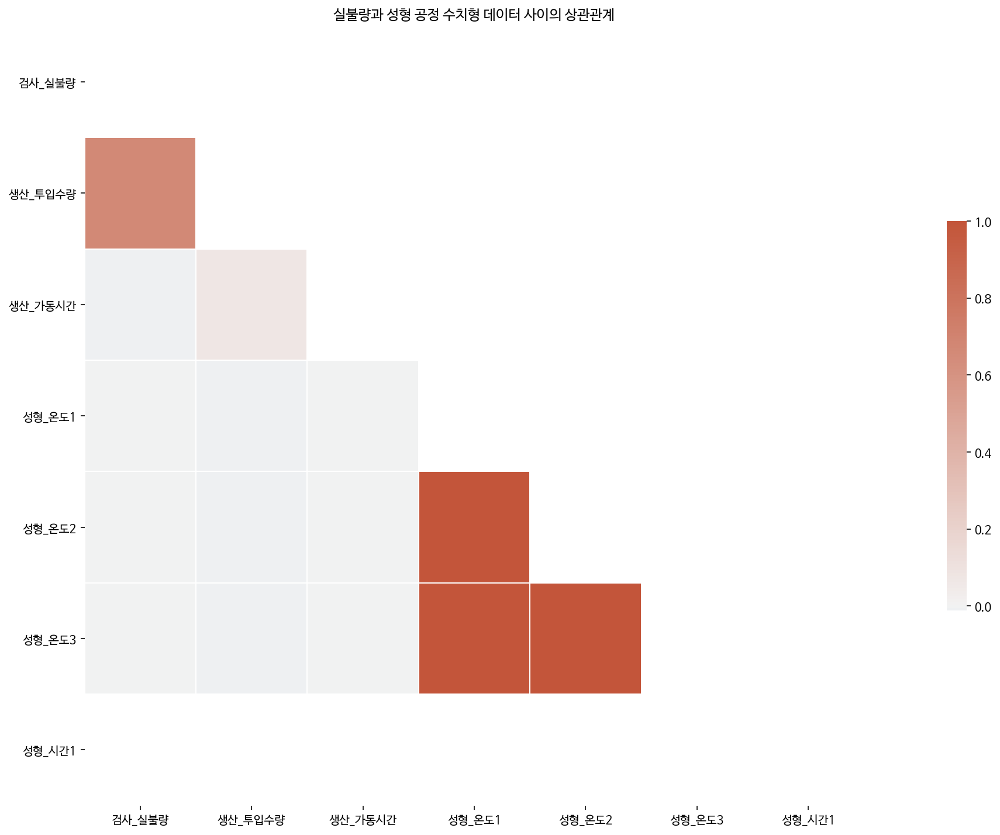

In [ ]:
mask = np.triu(np.ones_like(jointable[['검사_실불량', '생산_투입수량', '생산_가동시간', '성형_온도1', '성형_온도2', '성형_온도3', '성형_시간1']].corr()))

f, ax = plt.subplots(figsize=(20, 10))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(jointable[['검사_실불량', '생산_투입수량', '생산_가동시간', '성형_온도1', '성형_온도2', '성형_온도3', '성형_시간1']].corr(), 
            mask=mask,
            cmap=cmap, 
            center=0,
            square=True, 
            linewidths=.5, 
            cbar_kws={"shrink": .5})

plt.title('실불량과 성형 공정 수치형 데이터 사이의 상관관계')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

성형 시간에 대한 데이터는 결측되었고 불량과 요인간 상관관계는 전혀 없는 수준이며 투입수량만 강한 상관관계를 나타낸다. 따라서 기록된 데이터 상으로는 성형 공정과 실불량 사이의 상관관계를 찾기 어려우며 작업량이 많아질수록 많이 발생한다는 사실만 남는다.

In [ ]:
df = jointable[['검사_실불량','생산로트','성형로트','생산_투입수량','생산기계번호','생산_가동시간','성형_온도1','성형_온도2','성형_온도3','성형_시간1','생산_작업자','생산_작업날짜']].sort_values(by='검사_실불량', ascending=False).head(100)
df

,검사_실불량,생산로트,성형로트,생산_투입수량,생산기계번호,생산_가동시간,성형_온도1,성형_온도2,성형_온도3,성형_시간1,생산_작업자,생산_작업날짜
5092,224,180306-A-15,nan,1500,A,0,125,125,125,40,손수원,2018-03-06
5404,197,180312-B-20,nan,1500,B,0,125,125,125,40,손수원,2018-03-12
4244,190,180123-A-01,nan,1500,A,0,125,125,125,40,손수원,2018-01-23
4246,184,180123-A-03,nan,1000,A,0,125,125,125,40,손수원,2018-01-23
4886,182,180226-A-15,nan,1430,A,0,125,125,125,40,손수원,2018-02-26
4890,164,180226-B-01,nan,1460,B,0,125,125,125,40,손수원,2018-02-26
4834,160,180223-A-11,nan,1460,A,0,125,125,125,40,손수원,2018-02-23
4259,153,180124-B-02,nan,1500,B,0,125,125,125,40,손수원,2018-01-24
21908,146,190711-A-07,nan,1500,A,0,125,125,125,40,박정연,2019-07-11
4903,145,180226-B-13,nan,1400,B,0,125,125,125,40,손수원,2018-02-26


# **기포불량 - 성형 공정(trt)**
기포불량과 성형 공정 간 상관관계 확인을 위해 성형로트와 매치하여 탐색해보는 과정이다.

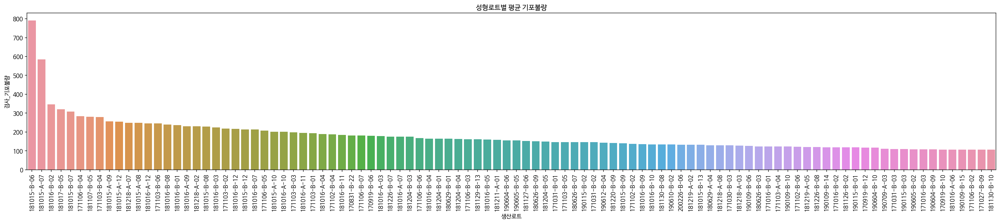

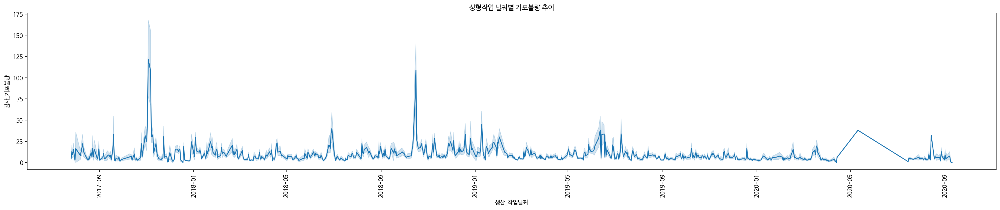

In [ ]:
# 성형로트별 기포불량 발생 확인하여 불량 요인이 되는 특정 로트 추적
plt.figure(figsize=(30,5))
plt.title('성형로트별 평균 기포불량')
temp = jointable.groupby(['생산로트'])['검사_기포불량'].mean().to_frame().sort_values(by='검사_기포불량', ascending=False).head(100)
sns.barplot(data=temp, x=temp.index, y='검사_기포불량')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(30,5))
plt.title('성형작업 날짜별 기포불량 추이')
temp = jointable.groupby(['생산로트','생산_작업날짜'])['검사_기포불량'].mean().to_frame().sort_values(by='생산_작업날짜')
sns.lineplot(data=temp, x='생산_작업날짜', y='검사_기포불량')
plt.xticks(rotation=90)
plt.show()

2017년도 11월경과 2018년도 11월경에 일정하게 반복되는 패턴이 있으므로 원인이 무엇인지 알아볼 필요가 있다. 

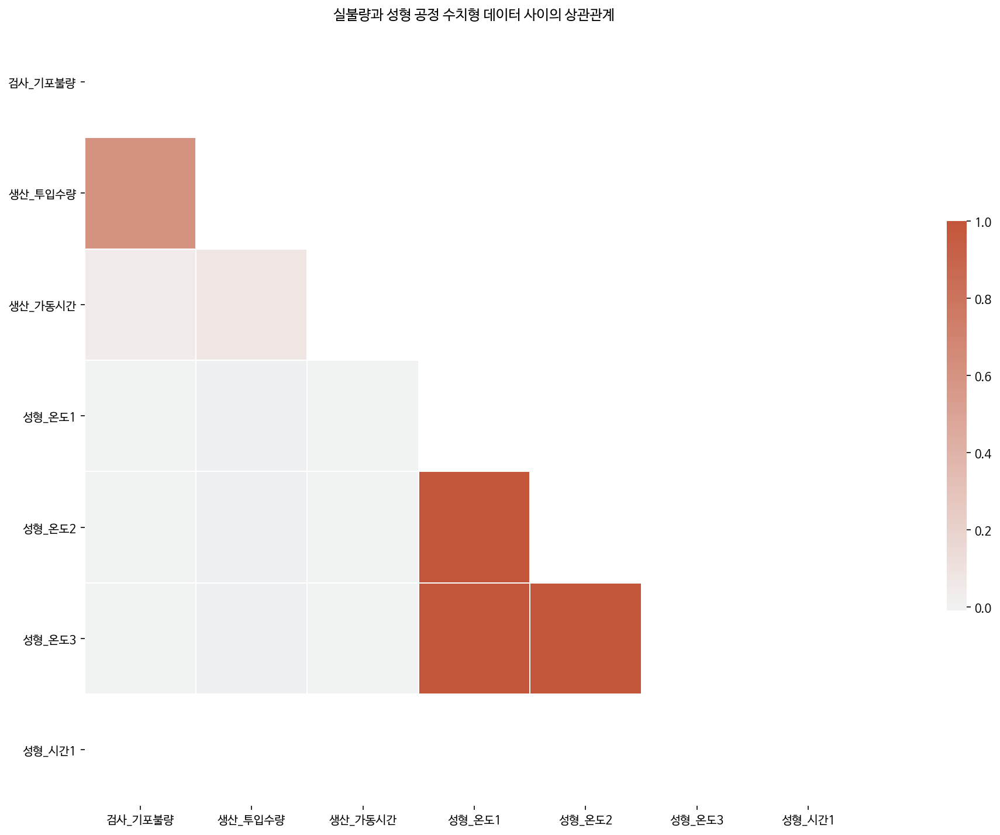

In [ ]:
mask = np.triu(np.ones_like(jointable[['검사_기포불량', '생산_투입수량', '생산_가동시간', '성형_온도1', '성형_온도2', '성형_온도3', '성형_시간1']].corr()))

f, ax = plt.subplots(figsize=(20, 10))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(jointable[['검사_기포불량', '생산_투입수량', '생산_가동시간', '성형_온도1', '성형_온도2', '성형_온도3', '성형_시간1']].corr(), 
            mask=mask,
            cmap=cmap, 
            center=0,
            square=True, 
            linewidths=.5, 
            cbar_kws={"shrink": .5})

plt.title('실불량과 성형 공정 수치형 데이터 사이의 상관관계')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
df = jointable[['검사_기포불량','생산로트','성형로트','생산_투입수량','생산기계번호','생산_가동시간','성형_온도1','성형_온도2','성형_온도3','성형_시간1','생산_작업자','생산_작업날짜']].sort_values(by='검사_기포불량', ascending=False).head(100)
df

,검사_기포불량,생산로트,성형로트,생산_투입수량,생산기계번호,생산_가동시간,성형_온도1,성형_온도2,성형_온도3,성형_시간1,생산_작업자,생산_작업날짜
11789,791,181015-B-06,nan,1430,B,0,125,125,125,40,손수원,2018-10-15
11775,584,181015-A-07,nan,1500,A,0,125,125,125,40,손수원,2018-10-15
11822,347,181016-B-02,nan,1500,B,0,125,125,125,40,손수원,2018-10-16
11857,321,181017-B-05,nan,1430,B,0,125,125,125,40,손수원,2018-10-17
11790,308,181015-B-07,nan,1430,B,0,125,125,125,40,손수원,2018-10-15
2500,284,171106-B-04,nan,1500,B,0,125,125,125,40,손수원,2017-11-06
12527,280,181107-B-05,nan,1450,B,0,125,125,125,40,손수원,2018-11-07
2481,279,171103-B-04,nan,1500,B,0,125,125,125,40,손수원,2017-11-03
11777,256,181015-A-09,nan,1500,A,0,125,125,125,40,손수원,2018-10-15
11780,254,181015-A-12,nan,1430,A,0,125,125,125,40,손수원,2018-10-15


# **기포불량 - 샌드 공정**

In [ ]:
# 샌드 열처리온도, 열처리시간으로 컬럼 나눠서 전처리 필요
# jointable['샌드_열처리온도-시간'].unique()

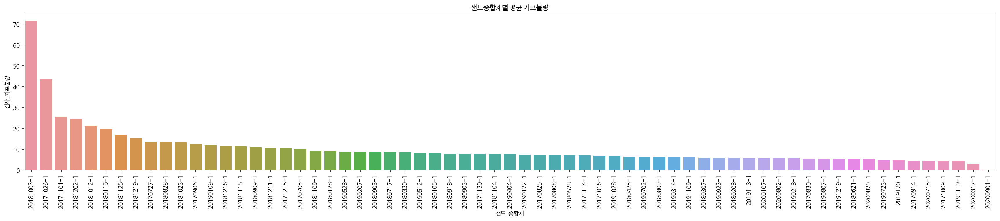

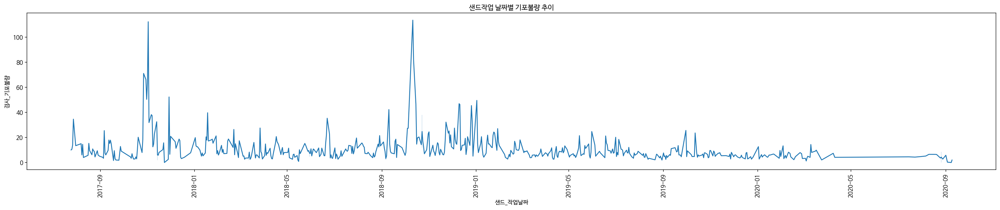

In [ ]:
# 성형중합체 데이터가 없으므로 추적 불가
# 샌드중합체별 기포불량 발생을 확인하여 불량 요인이 되는 특정 샌드중합체 추적
plt.figure(figsize=(30,5))
plt.title('샌드중합체별 평균 기포불량')
temp = jointable.groupby(['샌드_중합체'])['검사_기포불량'].mean().to_frame().sort_values(by='검사_기포불량', ascending=False).head(100)
sns.barplot(data=temp, x=temp.index, y='검사_기포불량')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(30,5))
plt.title('샌드작업 날짜별 기포불량 추이')
temp = jointable.groupby(['샌드_중합체','샌드_작업날짜'])['검사_기포불량'].mean().to_frame().sort_values(by='샌드_작업날짜', ascending=False)
sns.lineplot(data=temp, x='샌드_작업날짜', y='검사_기포불량')
plt.xticks(rotation=90)
plt.show()

샌드 공정에서도 마찬가지로 특정 년도 11월경에 불량이 급격히 늘어난 것을 알 수 있다. 해당 기간에 기포불량을 크게 유발하는 요인이 있음이 확실해 보인다.

In [ ]:
jointable[['검사_기포불량','샌드_중합체','샌드기계번호','샌드_가동시간','샌드_건조기번호','샌드_열처리온도-시간','샌드_작업날짜','샌드_작업자']].sort_values(by='검사_기포불량',ascending=False).head(100)

,검사_기포불량,샌드_중합체,샌드기계번호,샌드_가동시간,샌드_건조기번호,샌드_열처리온도-시간,샌드_작업날짜,샌드_작업자
11789,791,20181003-1,S0,360.0,D0,75-60,2018-10-11,엄용
11775,584,20181003-1,S0,480.0,D0,75-60,2018-10-12,엄용
11822,347,20181003-1,S0,350.0,D0,75-60,2018-10-12,엄용
11857,321,20181012-1,S0,480.0,D0,75-60,2018-10-15,엄용
11790,308,20181003-1,S0,360.0,D0,75-60,2018-10-11,엄용
2500,284,20171101-1,S0,240.0,D0,75-60,2017-11-02,엄용
12527,280,20181023-1,S0,480.0,D0,75-60,2018-10-31,엄용
2481,279,20171026-1,S0,360.0,D0,75-60,2017-11-01,엄용
11777,256,20181003-1,S0,480.0,D0,75-60,2018-10-10,엄용
11780,254,20181003-1,S0,480.0,D0,75-60,2018-10-12,엄용


# **기포불량 - 컬러중합체(=인쇄중합체)**

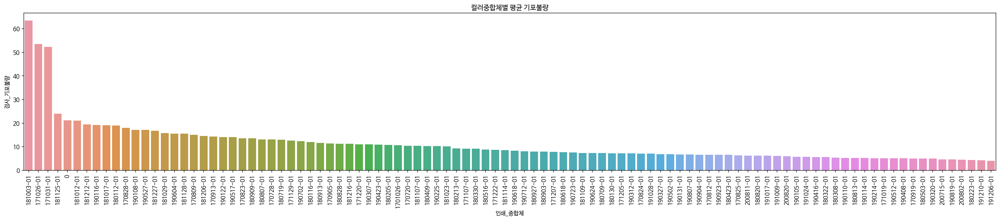

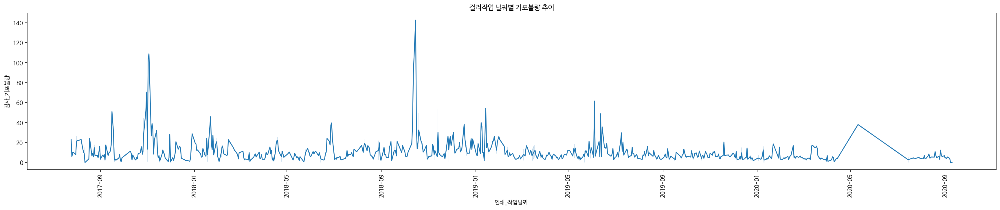

In [ ]:
# 컬러중합체별 기포불량 발생을 확인하여 불량 요인이 되는 특정 컬러중합체 추적
plt.figure(figsize=(30,5))
plt.title('컬러중합체별 평균 기포불량')
temp = jointable.groupby(['인쇄_중합체'])['검사_기포불량'].mean().to_frame().sort_values(by='검사_기포불량', ascending=False).head(100)
sns.barplot(data=temp, x=temp.index, y='검사_기포불량')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(30,5))
plt.title('컬러작업 날짜별 기포불량 추이')
temp = jointable.groupby(['인쇄_중합체','인쇄_작업날짜'])['검사_기포불량'].mean().to_frame().sort_values(by='인쇄_작업날짜', ascending=False)
sns.lineplot(data=temp, x='인쇄_작업날짜', y='검사_기포불량')
plt.xticks(rotation=90)
plt.show()

In [ ]:
jointable[['검사_기포불량','인쇄_중합체','인쇄로트','인쇄_투입수량','인쇄기계번호','인쇄_가동시간','인쇄_건조기번호','인쇄_열처리온도-시간','인쇄_작업날짜','인쇄_작업자']].sort_values(by='검사_기포불량',ascending=False).head(100)

,검사_기포불량,인쇄_중합체,인쇄로트,인쇄_투입수량,인쇄기계번호,인쇄_가동시간,인쇄_건조기번호,인쇄_열처리온도-시간,인쇄_작업날짜,인쇄_작업자
11789,791,181003-01,181012-P03-02,5400,P03,330,D0,150-120,2018-10-12,엄용
11775,584,181003-01,181012-P02-01,3000,P02,180,D0,150-120,2018-10-12,엄용
11822,347,181003-01,181015-P02-01,3000,P02,180,D0,150-120,2018-10-15,엄용
11857,321,181012-01,181016-P09-01,3700,P09,220,D0,150-120,2018-10-16,엄용
11790,308,181003-01,181012-P03-02,5400,P03,330,D0,150-120,2018-10-12,엄용
2500,284,171031-01,171103-P09-01,5000,P09,470,D0,158-120,2017-11-03,엄용
12527,280,181029-01,181106-P09-04,2000,P09,230,D0,150-120,2018-11-06,엄용
2481,279,171031-01,171103-P01-01,4000,P01,470,D0,158-120,2017-11-03,엄용
11777,256,181003-01,181011-P02-01,1500,P02,90,D0,150-120,2018-10-11,엄용
11780,254,181003-01,181015-P03-01,6000,P03,360,D0,150-120,2018-10-15,엄용


# **5대 주요 불량 - 상관관계 분석(pairplot-scatter, heatmap)**

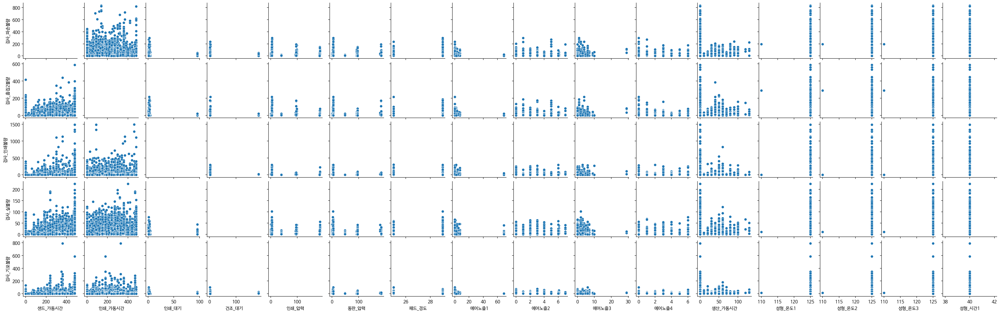

In [ ]:
# 각 불량과 공정 별 주요 수치 간의 상관관계
main_flt_list = ['검사_파손불량', '검사_흠집2불량', '검사_인쇄불량', '검사_실불량', '검사_기포불량']
flt_feature_list = ['샌드_가동시간', '인쇄_가동시간', '인쇄_대기', '건조_대기', '인쇄_압력', '동판_압력', '패드_경도', '에어노즐1', '에어노즐2', '에어노즐3', '에어노즐4', 
                    '생산_가동시간', '성형_온도1', '성형_온도2', '성형_온도3', '성형_시간1']

sns.pairplot(data=jointable, x_vars=flt_feature_list, y_vars=main_flt_list, size=2)
plt.show()

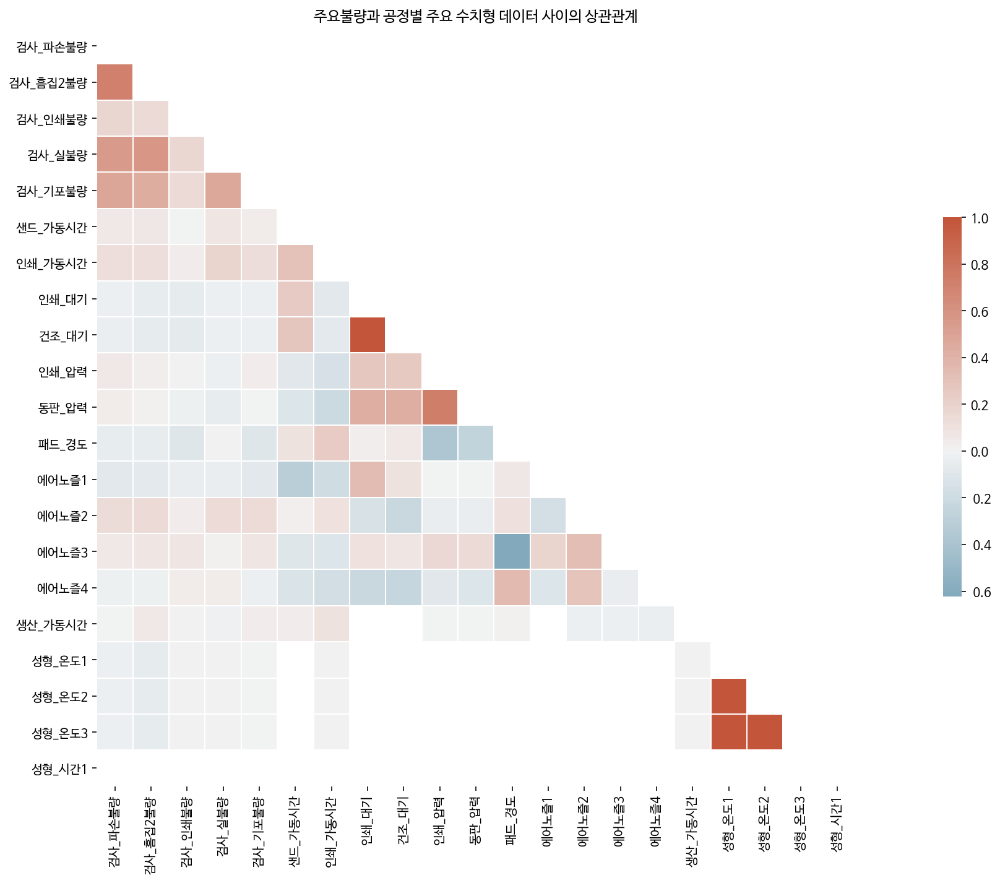

In [ ]:
# 히트맵을 통해 보다 직관적으로 상관관계 파악
mask = np.triu(np.ones_like(jointable[main_flt_list+flt_feature_list].corr()))

f, ax = plt.subplots(figsize=(20, 10))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(jointable[main_flt_list+flt_feature_list].corr(), 
            mask=mask,
            cmap=cmap, 
            center=0,
            square=True, 
            linewidths=.5, 
            cbar_kws={"shrink": .5})

plt.title('주요불량과 공정별 주요 수치형 데이터 사이의 상관관계')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# **총평**
**파손불량**과 **흠집2불량**은 어느정도 계절(습도-건조)의 영향을 받을 수 있다고 보여지며 특히 **파손불량**의 경우 **탈거 및 수화** 공정 중 많이 발생하므로 해당 공정 중 **건조의 강도를 조금 낮춤으로써 개선**할 여지가 있지 않을까 생각된다.<br><br>
**파손불량**이 **수화** 작업자에 따라 변동치가 있음을 확인했고 작업자를 **자동화장비로 대체**하는 것이 불량을 줄이는 방법으로 제시될 수 있다고 여겨진다.<br><br>
**파손불량**이 **인쇄** 공정 중 유독 **P00** 기계에서 많이 발생함을 확인했지만 해당 기계의 인쇄 설정 값이 기록되어 있지 않으므로 정확한 요인을 확인하기 어렵다. 다만 설정값의 문제보다는 **기계가 노후한 것이 아닐까 의심**되므로 해당 기계의 **사용을 줄이는 방향으로 불량 개선**을 도모할 수 있다 여겨진다.
<br><br>
**탈거** 공정에 **작업자로 자동화장비를 도입**하는 것이 일정 수준 **흠집2불량 개선에 도움**이 되리라 판단되지만 **변화가 그리 크지 않을 것**이라 예상되므로 우선 순위는 아니라고 받아들여진다.
<br><br>
**인쇄불량**이 **특정 샌드중합체에서 많이 발생**함이 관측되었으므로 **중합체 품질에 따라 불량이 증가**할 수 있음을 확인했다. 해당 요인은 공정 상 개선 여지는 없다 여겨지고 **중합체 관리 및 납품 단계에서 품질이 저하됐을 가능성**이 있다고 보여진다.
<br><br>
그 외에 인쇄기 설정값 관련 불량 요인과 중합체 관련 불량요인은 도메인 지식 부족으로 분석이 불가하다. 따라서 불량이 많이 발생한 데이터들을 표의 형태로 해당 절에 포함하였으니 참고해주시기 바란다.